# Test Prediction Type: wrong or correct
## Node classification - Real world dataset

In [45]:
import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import torch
import seaborn as sns
from matplotlib import axes
import os 
import pandas as pd
import json

import sys, os
sys.path.append('/cluster/home/kamara/Explain')
from clutils.nbutils import *
from clutils.nbutils.params import get_param_ranges
os.getcwd()
sns.set()

In [46]:
pal = sns.color_palette("Paired", 12)
dict_color = {"random":pal[0], "distance":pal[1], "pagerank":pal[2], "sa": pal[3], "ig": pal[4], "gradcam": pal[5], "occlusion":pal[6], 
              "basic_gnnexplainer": pal[7], "gnnexplainer": pal[8], 
              "pgmexplainer":pal[9], "subgraphx": pal[10], "pgexplainer": pal[11]}


In [47]:
sns.set_context("notebook", rc={"legend.fontsize":20, "legend.title_fontsize":20, 
                                "axes.titlesize":19,"axes.labelsize":17,
                               "xtick.labelsize" : 16, "ytick.labelsize" : 16})


In [48]:
dir = '/cluster/home/kamara/Explain/csv/node_classification/real/prediction_type'

jsonpath = f'/cluster/home/kamara/Explain/configs/real/config_real_1expe_testpred.json'
ranges = get_param_ranges(jsonpath)

df_res = pd.read_csv(os.path.join(dir, f'nc_real_predtype_1expe.csv'), index_col = 0)
res = df_res.groupby(by=['dataset', 'topk', 'explainer_name', 'true_label_as_target', 'hard_mask', 'testing_pred']).mean()
res = res.reset_index()

In [49]:
def explainer_type(row):
    if row['explainer_name'] in ['basic_gnnexplainer', 'gnnexplainer', 'pgmexplainer', 'occlusion', 'subgraphx', 'pgexplainer'] :
      return('pertubation')
    elif row['explainer_name'] in ['sa', 'ig', 'gradcam'] :
      return('gradient')
    return('baseline')

df_res['type'] = df_res.apply(lambda row: explainer_type(row), axis=1)

In [50]:
df_res["1-fidelity_acc-"] = 1- df_res["fidelity_acc-"]
df_res["1-fidelity_prob-"] = 1- df_res["fidelity_prob-"]
df_res['charact_prob'] = 2 * df_res['fidelity_prob+'] * (1-df_res['fidelity_prob-'])/ (df_res['fidelity_prob+']  + 1-df_res['fidelity_prob-'])
df_res['charact_acc'] = 2 * df_res['fidelity_acc+'] * (1-df_res['fidelity_acc-'])/ (df_res['fidelity_acc+']  + 1-df_res['fidelity_acc-'])


In [51]:
df_res["1-fidelity_gnn_acc-"] = 1- df_res["fidelity_gnn_acc-"]
df_res["1-fidelity_gnn_prob-"] = 1- df_res["fidelity_gnn_prob-"]
df_res['charact_gnn_prob'] = 2 * df_res['fidelity_gnn_prob+'] * (1-df_res['fidelity_gnn_prob-'])/ (df_res['fidelity_gnn_prob+']  + 1-df_res['fidelity_gnn_prob-'])
df_res['charact_gnn_acc'] = 2 * df_res['fidelity_gnn_acc+'] * (1-df_res['fidelity_gnn_acc-'])/ (df_res['fidelity_gnn_acc+']  + 1-df_res['fidelity_gnn_acc-'])


In [52]:
df_res = df_res.reset_index()
df_res

,dataset,true_label_as_target,hard_mask,topk,explainer_name,testing_pred,num_test,fidelity_acc+,fidelity_acc-,fidelity_prob+,...,number_of_edges,type,1-fidelity_acc-,1-fidelity_prob-,charact_prob,charact_acc,1-fidelity_gnn_acc-,1-fidelity_gnn_prob-,charact_gnn_prob,charact_gnn_acc
0,actor,False,False,1.0,basic_gnnexplainer,correct,100.0,-1.00,-1.00,-1.000000,...,60918.0,pertubation,2.00,2.000000,-4.000000,-4.000000,0.58,0.886183,8.505756e-03,0.038667
1,actor,False,False,1.0,basic_gnnexplainer,wrong,100.0,-1.00,-1.00,-1.000000,...,60918.0,pertubation,2.00,2.000000,-4.000000,-4.000000,0.58,0.902061,0.000000e+00,0.000000
2,actor,False,False,1.0,distance,correct,100.0,-1.00,-1.00,-1.000000,...,60918.0,baseline,2.00,2.000000,-4.000000,-4.000000,0.61,0.893534,3.323910e-02,0.125588
3,actor,False,False,1.0,distance,wrong,100.0,-1.00,-1.00,-1.000000,...,60918.0,baseline,2.00,2.000000,-4.000000,-4.000000,0.58,0.902061,2.032518e-07,0.000000
4,actor,False,False,1.0,gnnexplainer,correct,100.0,-1.00,-1.00,-1.000000,...,60918.0,pertubation,2.00,2.000000,-4.000000,-4.000000,0.59,0.901947,1.377780e-01,0.497451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1776,facebook,True,True,100.0,occlusion,wrong,100.0,0.11,0.24,-0.000172,...,364116.0,pertubation,0.76,1.040893,-0.000344,0.192184,2.00,2.000000,-4.000000e+00,-4.000000
1777,facebook,True,True,100.0,pagerank,correct,100.0,0.73,0.06,0.184473,...,364116.0,baseline,0.94,0.992544,0.311121,0.821796,2.00,2.000000,-4.000000e+00,-4.000000
1778,facebook,True,True,100.0,pgmexplainer,correct,100.0,0.36,0.08,0.084724,...,364116.0,pertubation,0.92,0.985278,0.156031,0.517500,2.00,2.000000,-4.000000e+00,-4.000000
1779,facebook,True,True,100.0,pgmexplainer,wrong,100.0,0.11,0.24,-0.000172,...,364116.0,pertubation,0.76,1.041453,-0.000344,0.192184,2.00,2.000000,-4.000000e+00,-4.000000


In [53]:
df_res.loc[df_res['true_label_as_target']==False, 'charact_prob'] = df_res['charact_gnn_prob']
df_res.loc[df_res['true_label_as_target']==False, 'fidelity_prob+'] = df_res['fidelity_gnn_prob+']
df_res.loc[df_res['true_label_as_target']==False, "1-fidelity_prob-"] = df_res["1-fidelity_gnn_prob-"]

df_res.loc[df_res['true_label_as_target']==False, 'charact_acc'] = df_res['charact_gnn_acc']
df_res.loc[df_res['true_label_as_target']==False, 'fidelity_acc+'] = df_res['fidelity_gnn_acc+']
df_res.loc[df_res['true_label_as_target']==False, "1-fidelity_acc-"] = df_res["1-fidelity_gnn_acc-"]


In [54]:
df_res

,dataset,true_label_as_target,hard_mask,topk,explainer_name,testing_pred,num_test,fidelity_acc+,fidelity_acc-,fidelity_prob+,...,number_of_edges,type,1-fidelity_acc-,1-fidelity_prob-,charact_prob,charact_acc,1-fidelity_gnn_acc-,1-fidelity_gnn_prob-,charact_gnn_prob,charact_gnn_acc
0,actor,False,False,1.0,basic_gnnexplainer,correct,100.0,0.02,-1.00,4.273386e-03,...,60918.0,pertubation,0.58,0.886183,8.505756e-03,0.038667,0.58,0.886183,8.505756e-03,0.038667
1,actor,False,False,1.0,basic_gnnexplainer,wrong,100.0,0.00,-1.00,0.000000e+00,...,60918.0,pertubation,0.58,0.902061,0.000000e+00,0.000000,0.58,0.902061,0.000000e+00,0.000000
2,actor,False,False,1.0,distance,correct,100.0,0.07,-1.00,1.693453e-02,...,60918.0,baseline,0.61,0.893534,3.323910e-02,0.125588,0.61,0.893534,3.323910e-02,0.125588
3,actor,False,False,1.0,distance,wrong,100.0,0.00,-1.00,1.016259e-07,...,60918.0,baseline,0.58,0.902061,2.032518e-07,0.000000,0.58,0.902061,2.032518e-07,0.000000
4,actor,False,False,1.0,gnnexplainer,correct,100.0,0.43,-1.00,7.458572e-02,...,60918.0,pertubation,0.59,0.901947,1.377780e-01,0.497451,0.59,0.901947,1.377780e-01,0.497451
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1776,facebook,True,True,100.0,occlusion,wrong,100.0,0.11,0.24,-1.720494e-04,...,364116.0,pertubation,0.76,1.040893,-3.441557e-04,0.192184,2.00,2.000000,-4.000000e+00,-4.000000
1777,facebook,True,True,100.0,pagerank,correct,100.0,0.73,0.06,1.844729e-01,...,364116.0,baseline,0.94,0.992544,3.111213e-01,0.821796,2.00,2.000000,-4.000000e+00,-4.000000
1778,facebook,True,True,100.0,pgmexplainer,correct,100.0,0.36,0.08,8.472401e-02,...,364116.0,pertubation,0.92,0.985278,1.560309e-01,0.517500,2.00,2.000000,-4.000000e+00,-4.000000
1779,facebook,True,True,100.0,pgmexplainer,wrong,100.0,0.11,0.24,-1.720494e-04,...,364116.0,pertubation,0.76,1.041453,-3.441557e-04,0.192184,2.00,2.000000,-4.000000e+00,-4.000000


# Mask statistics - select dataset

In [55]:
input_dataset = "cora"

df_mask_dataset = df_res[(df_res.dataset==input_dataset)&(df_res.true_label_as_target==True)&(df_res.hard_mask==True)]
dfc = df_mask_dataset[["topk", "testing_pred", "explainer_name", "mask_size_transf", "mask_entropy_transf", "max_avg_transf", "charact_prob"]]
pd.pivot_table(dfc, values=["testing_pred", "mask_size_transf", "mask_entropy_transf", "max_avg_transf", "charact_prob"], index=['explainer_name'], columns='topk')

charact_prob                                          \
topk                      1.0       2.0       5.0       10.0      20.0    
explainer_name                                                            
basic_gnnexplainer    -0.000465 -0.000529  0.003749  0.011942  0.024263   
distance              -0.003502 -0.003048  0.007637  0.021948  0.047488   
gnnexplainer           0.037764  0.041216  0.042760  0.054738  0.053623   
gradcam               -0.001191  0.018567  0.060434  0.100864  0.108500   
occlusion              0.021258  0.046509  0.098807  0.112471  0.111447   
pagerank              -0.002956  0.018506  0.043736  0.088696  0.103392   
pgexplainer           -0.002246 -0.002246 -0.002246 -0.002295 -0.002424   
pgmexplainer          -0.001715  0.005016  0.021378  0.041916  0.064007   
random                -0.007594 -0.007594 -0.007564 -0.007564 -0.007564   
subgraphx              0.002275  0.004371  0.006414  0.009710  0.009710   

                             mask_entropy_transf                      \
topk                   100.0               1.0       2.0       5.0     
explainer_name                                                         
basic_gnnexplainer  0.070884                 0.0  0.673172  1.493827   
distance            0.095966                 0.0  0.693147  1.576387   
gnnexplainer        0.082792                 0.0  0.628038  1.361379   
gradcam             0.109261                 0.0  0.674474  1.569546   
occlusion           0.109307                 0.0  0.654133  1.420444   
pagerank            0.105724                 0.0  0.678055  1.586861   
pgexplainer        -0.002866                 0.0  0.692273  1.606349   
pgmexplainer        0.095139                 0.0  0.692593  1.602988   
random             -0.007693                 0.0  0.693147  1.609438   
subgraphx           0.009710                 0.0  0.131698  0.276785   

                              ... mask_size_transf                        \
topk                   10.0   ...            5.0    10.0   20.0    100.0   
explainer_name                ...                                          
basic_gnnexplainer  2.011175  ...             4.98   9.78  18.41   62.77   
distance            2.226024  ...             4.98   9.87  19.39   95.39   
gnnexplainer        1.798976  ...             4.98   9.78  18.41   62.77   
gradcam             2.171871  ...             4.98   9.69  18.32   68.48   
occlusion           1.949280  ...             4.94   9.64  18.17   61.73   
pagerank            2.233477  ...             4.98   9.87  19.39   95.39   
pgexplainer         2.277768  ...             5.00  10.00  20.00  100.00   
pgmexplainer        2.274131  ...             4.98   9.85  19.10   80.54   
random              2.302585  ...             5.00  10.00  20.00  100.00   
subgraphx           0.299486  ...             1.63   1.77   1.77    1.77   

                   max_avg_transf                                          \
topk                        1.0       2.0       5.0       10.0      20.0    
explainer_name                                                              
basic_gnnexplainer            1.0  0.969170  0.927267  0.816013  0.565653   
distance                      1.0  1.000000  0.907750  0.584283  0.489767   
gnnexplainer                  1.0  0.856417  0.721849  0.611291  0.381739   
gradcam                       1.0  0.721519  0.692427  0.523375  0.388290   
occlusion                     1.0  0.742671  0.466696  0.386505  0.363056   
pagerank                      1.0  0.718742  0.699947  0.519873  0.329923   
pgexplainer                   1.0  0.964801  0.963675  0.662613  0.557809   
pgmexplainer                  1.0  0.974980  0.944803  0.891748  0.825318   
random                        1.0  0.999929  0.999720  0.999468  0.999034   
subgraphx                     1.0  1.000000  1.000000  1.000000  1.000000   

                              
topk                   100.0  
explainer_name                
basic_gnnexplainer  0.

# Performance Summary
## When label is true...

In [56]:
input_topk = 10

df_perf = df_res[(df_res.topk==10)&(df_res.true_label_as_target==True)]
dfc = df_perf[["dataset", "explainer_name", "charact_prob", "hard_mask", "testing_pred"]]
pd.pivot_table(dfc, values="charact_prob", index=['explainer_name'], columns=['hard_mask', "testing_pred", 'dataset'])

hard_mask              False                                          \
testing_pred         correct                                           
dataset                actor chameleon      cora   cornell  facebook   
explainer_name                                                         
basic_gnnexplainer -0.007404  0.005722  0.041665  0.023427  0.001525   
distance            0.024145  0.040363  0.067838  0.087165  0.021305   
gnnexplainer        0.042605  0.110090  0.158369  0.162106  0.110645   
gradcam             0.057735  0.071265  0.143565  0.157387       NaN   
ig                       NaN       NaN       NaN  0.203841       NaN   
occlusion           0.074966  0.126310  0.166399  0.181487  0.116083   
pagerank            0.018931  0.052134  0.150653  0.155292  0.069511   
pgexplainer              NaN       NaN  0.000533       NaN       NaN   
pgmexplainer        0.006962  0.034896  0.120701  0.129643       NaN   
random              0.019953  0.099553  0.056151  0.039521       NaN   
sa                       NaN       NaN       NaN  0.260460       NaN   
subgraphx                NaN       NaN  0.037771  0.053025       NaN   

hard_mask                                                               True  \
testing_pred               wrong                                     correct   
dataset                    actor chameleon      cora      facebook     actor   
explainer_name                                                                 
basic_gnnexplainer -2.345443e-07  0.000001  0.000000 -3.650785e-07 -0.011382   
distance           -4.586886e-06  0.000010  0.000000           NaN -0.005343   
gnnexplainer       -9.717148e-03  0.001659 -0.008563 -1.043621e-02  0.014376   
gradcam            -8.657015e-06 -0.000037  0.000000           NaN  0.025035   
ig                           NaN       NaN       NaN           NaN       NaN   
occlusion           1.828371e-06  0.000243  0.000000 -1.975894e-07  0.064193   
pagerank            2.127886e-07  0.000002  0.000000           NaN  0.027411   
pgexplainer                  NaN       NaN  0.000013           NaN       NaN   
pgmexplainer        2.785023e-06 -0.000014  0.000000           NaN -0.010895   
random             -1.371584e-02 -0.033950 -0.017550           NaN -0.014095   
sa                           NaN       NaN       NaN           NaN       NaN   
subgraphx                    NaN       NaN  0.000000           NaN       NaN   

hard_mask                                                             \
testing_pred                                                   wrong   
dataset            chameleon      cora   cornell  facebook     actor   
explainer_name                                                         
basic_gnnexplainer  0.124880  0.021339  0.035880  0.014624 -0.013000   
distance            0.133222  0.041351  0.057242       NaN -0.013000   
gnnexplainer        0.109494  0.115851  0.132496  0.143255 -0.017910   
gradcam             0.132549  0.199183  0.213382  0.184999 -0.013000   
ig                       NaN       NaN  0.228089       NaN       NaN   
occlusion           0.137384  0.222397  0.235311  0.235427 -0.013000   
pagerank            0.097242  0.174847  0.185775  0.171449 -0.013000   
pgexplainer              NaN -0.007038       NaN       NaN       NaN   
pgmexplainer        0.132988  0.081287  0.084304  0.065135 -0.013000   
random              0.103565  0.003066  0.004985       NaN -0.007665   
sa                       NaN       NaN  0.257042       NaN       NaN   
subgraphx                NaN  0.016874  0.025596       NaN       NaN   

hard_mask                                         
testing_pred                                      
dataset            chameleon      cora  facebook  
explainer_name                                    
basic_gnnexplainer  0.020787  0.002546 -0.000344  
distance            0.020787  0.002546       NaN  
gnnexplainer        0.025954 -0.006375  0.000989  
gradcam             0.020787  0.002546       NaN  
ig   

# Performance VS Time

## Avg on all datasets

In [18]:
sns.set_context("notebook", rc={"legend.fontsize":12, "legend.title_fontsize":12, 
                                "axes.titlesize":14,"axes.labelsize":14,
                               "xtick.labelsize" : 12, "ytick.labelsize" : 12})


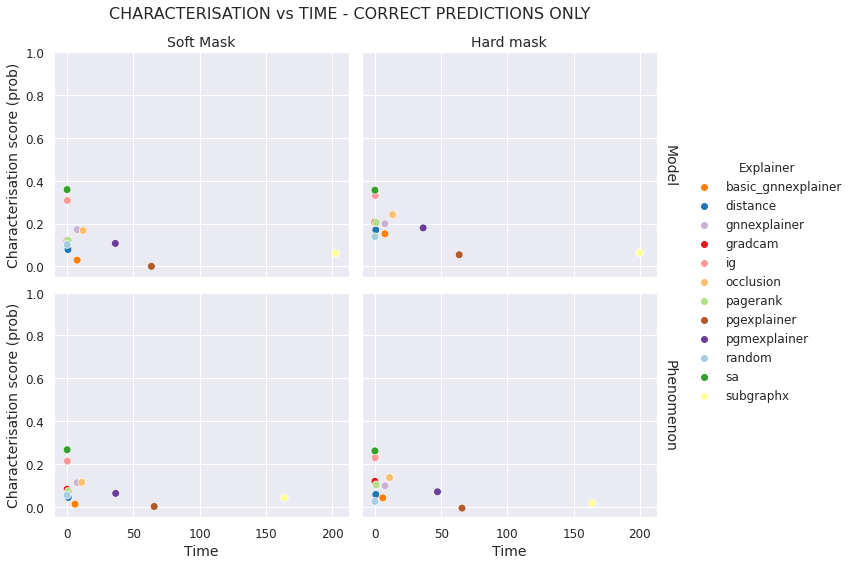

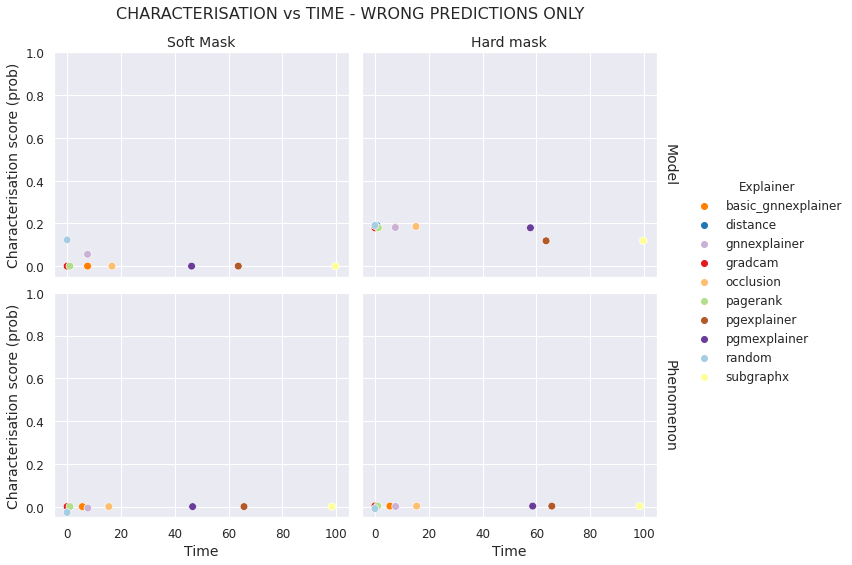

In [26]:
testing_pred_lst = ["correct", "wrong"]

for pred_type in testing_pred_lst:

    df_gen = df_res[df_res['testing_pred']==pred_type].groupby(['explainer_name', "true_label_as_target", 'hard_mask']).mean()
    df_gen = df_gen.reset_index()
    df_gen['hard_mask'] = df_gen['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen['true_label_as_target'] = df_gen['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})

    g = sns.FacetGrid(df_gen, row="true_label_as_target", col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="time", y="charact_prob",
        hue="explainer_name", palette=dict_color, marker="o", s=60)#.set(xscale = 'log')
    g.fig.suptitle(f"CHARACTERISATION vs TIME - {pred_type.upper()} PREDICTIONS ONLY", fontsize=16, x=0.43)
    #g.fig.suptitle("Averaged on all real-world datasets", fontsize=12, x=0.43, y=1)

    g.set(ylim=(-0.05,1))
    g.add_legend(title="Explainer")
    g.fig.subplots_adjust(top=0.9)
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Time", y_var="Characterisation score (prob)")
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/charact_vs_time/fig_all_prob_logx.pdf')
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/charact_vs_time/fig_all_prob_logx.png')

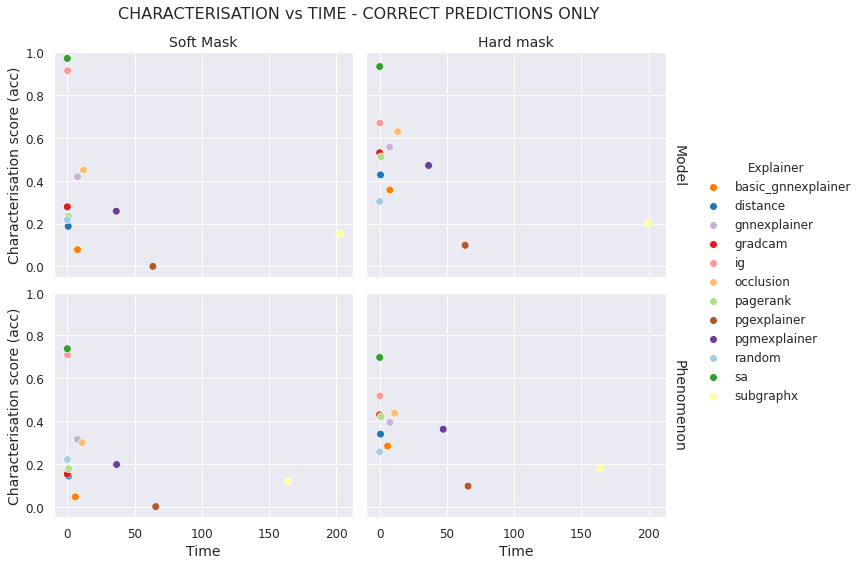

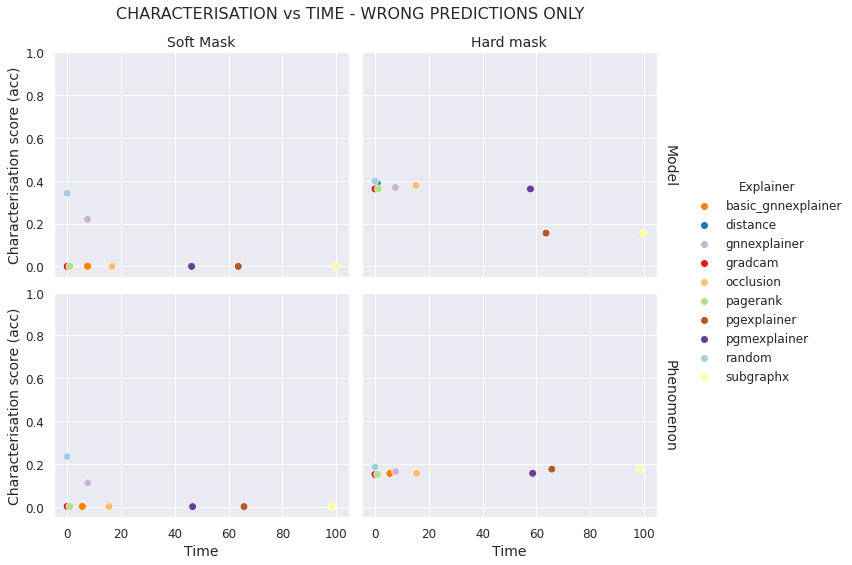

In [27]:
testing_pred_lst = ["correct", "wrong"]

for pred_type in testing_pred_lst:

    df_gen = df_res[df_res['testing_pred']==pred_type].groupby(['explainer_name', "true_label_as_target", 'hard_mask']).mean()
    df_gen = df_gen.reset_index()
    df_gen['hard_mask'] = df_gen['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen['true_label_as_target'] = df_gen['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})

    g = sns.FacetGrid(df_gen, row="true_label_as_target", col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="time", y="charact_acc",
        hue="explainer_name", palette=dict_color, marker="o", s=60)#.set(xscale = 'log')
    g.fig.suptitle(f"CHARACTERISATION vs TIME - {pred_type.upper()} PREDICTIONS ONLY", fontsize=16, x=0.43)
    #g.fig.suptitle("Averaged on all real-world datasets", fontsize=12, x=0.43, y=1)

    g.set(ylim=(-0.05,1))
    g.add_legend(title="Explainer")
    g.fig.subplots_adjust(top=0.9)
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Time", y_var="Characterisation score (acc)")
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/charact_vs_time/fig_all_prob_logx.pdf')
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/charact_vs_time/fig_all_prob_logx.png')

## Each dataset

In [31]:
datasets = ["cora", "facebook", "cornell", "actor", "chameleon"]

datasets & predtype cora correct
datasets & predtype cora wrong
datasets & predtype facebook correct
datasets & predtype facebook wrong
datasets & predtype cornell correct
datasets & predtype cornell wrong
DataFrame is empty!
datasets & predtype actor correct
datasets & predtype actor wrong
datasets & predtype chameleon correct
datasets & predtype chameleon wrong


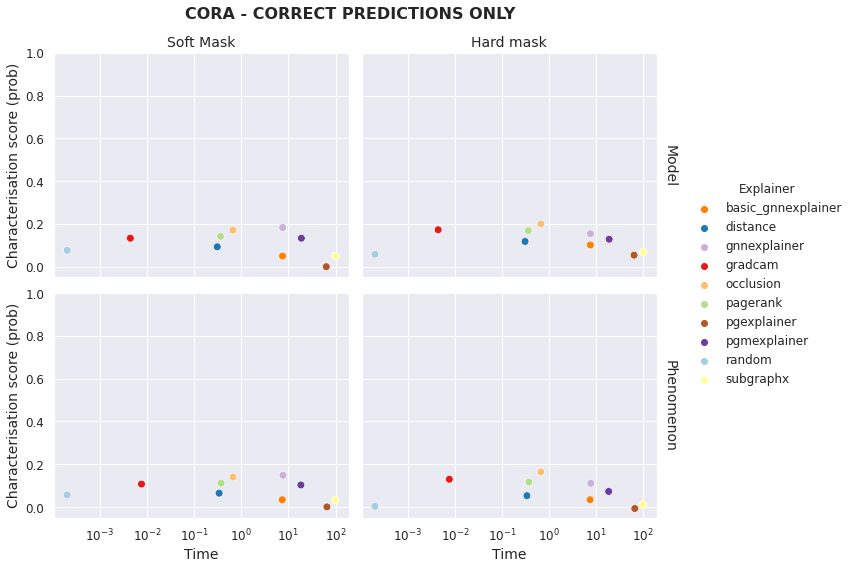

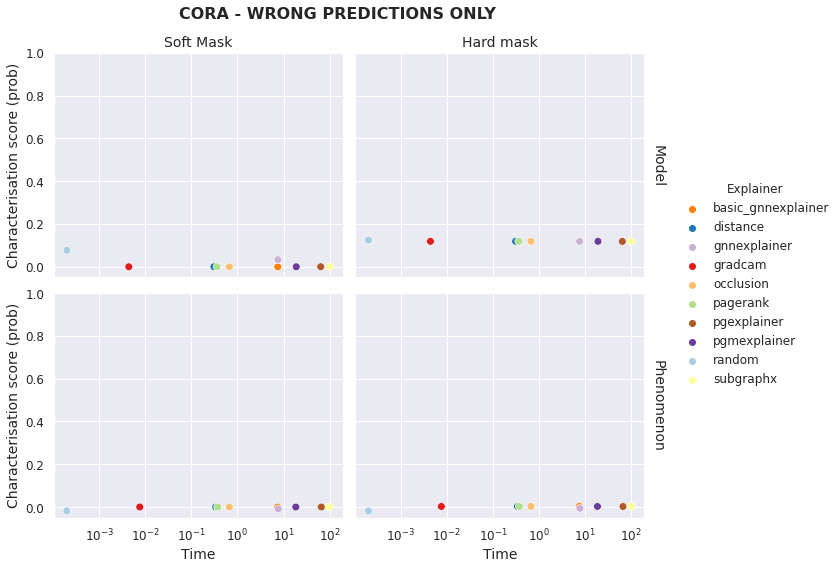

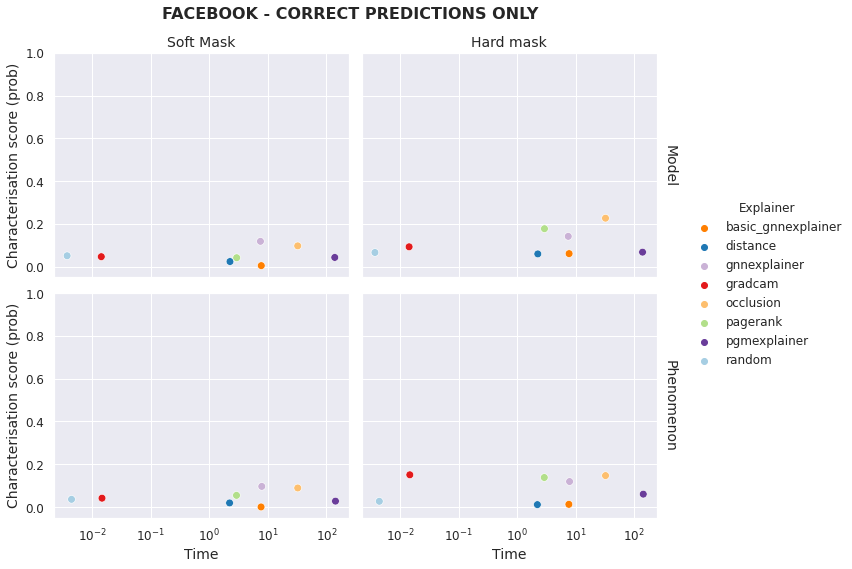

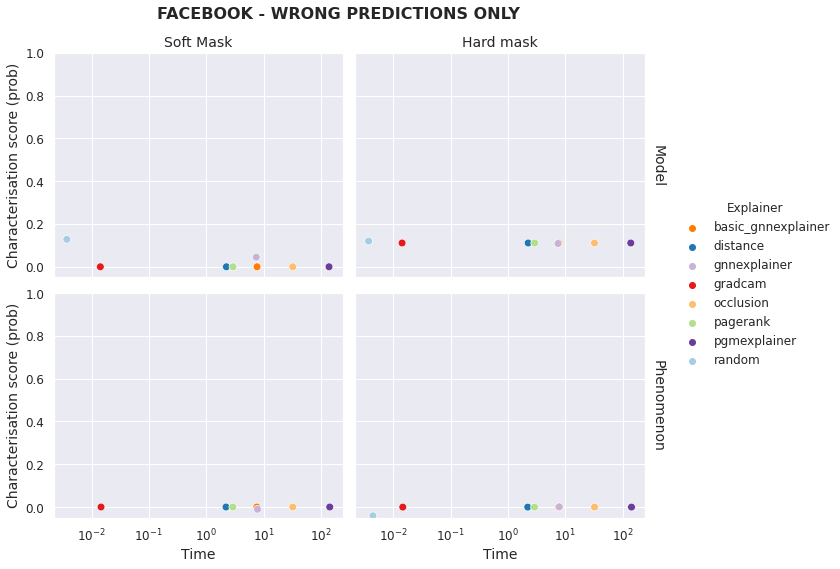

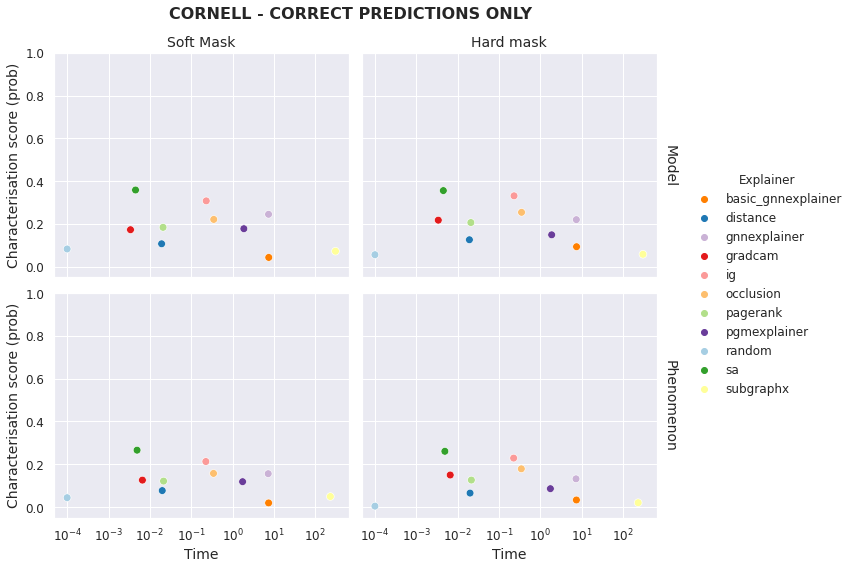

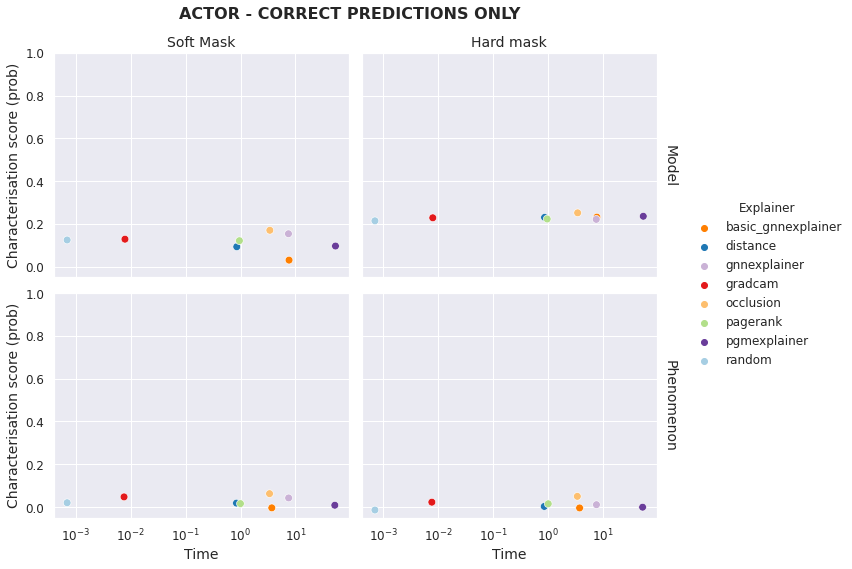

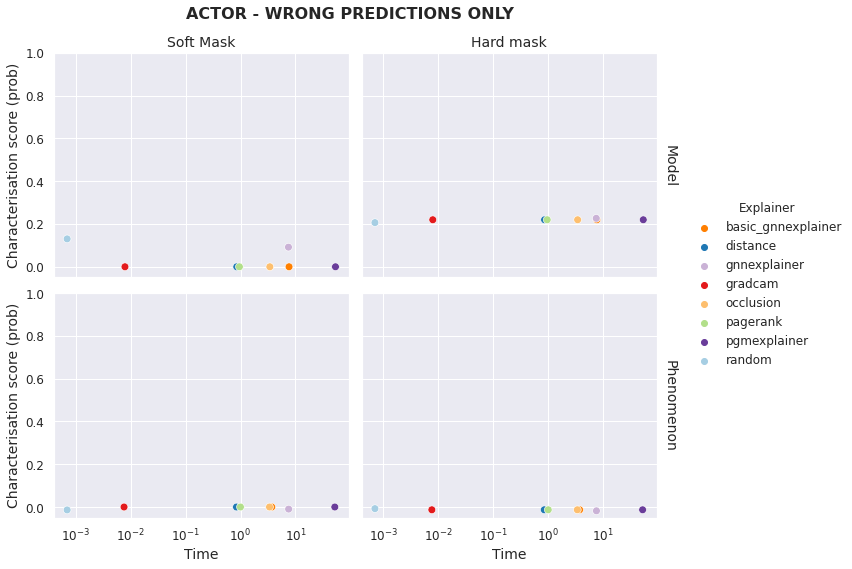

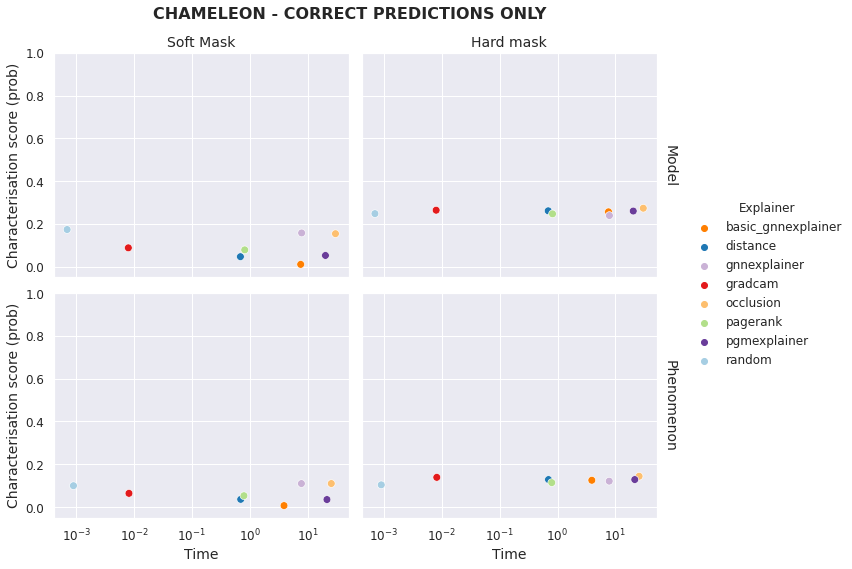

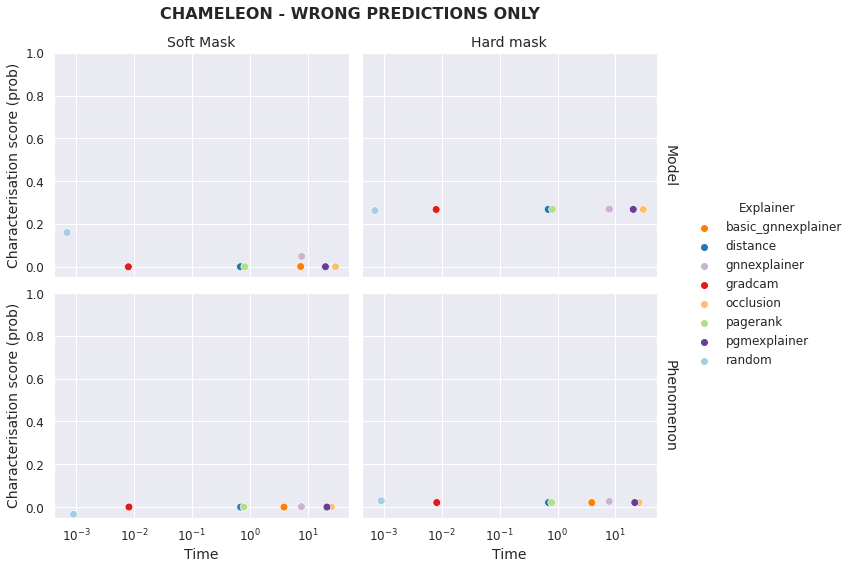

In [39]:
for data in datasets:
    df_gen_data = df_res[df_res['dataset']==data].groupby(['explainer_name', 'true_label_as_target', 'hard_mask', 'testing_pred']).mean()
    df_gen_data = df_gen_data.reset_index()
    
    for pred_type in testing_pred_lst:

        print("datasets & predtype", data, pred_type)
        
        df_gen_data_pred = df_gen_data[df_gen_data['testing_pred']==pred_type].groupby(['explainer_name', "true_label_as_target", 'hard_mask']).mean()
        df_gen_data_pred = df_gen_data_pred.reset_index()
        
        if df_gen_data_pred.empty:
            print('DataFrame is empty!')
            continue

        df_gen_data_pred['hard_mask'] = df_gen_data_pred['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
        df_gen_data_pred['true_label_as_target'] = df_gen_data_pred['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})

        g = sns.FacetGrid(df_gen_data_pred, row='true_label_as_target', col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
        g.map_dataframe(sns.scatterplot, x="time", y="charact_prob",
            hue="explainer_name", palette=dict_color, marker="o", s=60).set(xscale = 'log')
        g.set(ylim=(-0.05,1))
        g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
        g.fig.suptitle(f"{data.upper()} - {pred_type.upper()} PREDICTIONS ONLY", fontsize=16, weight='bold', x=0.43)
        g.add_legend(title="Explainer")
        g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
        g.set_axis_labels(x_var="Time", y_var="Characterisation score (prob)")

        #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/charact_vs_time/fig_{data}_prob_logx.pdf')
        #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/charact_vs_time/fig_{data}_prob_logx.png')


# Explanation type 
Default topk = 10

In [40]:
df = df_res[df_res['topk']==10]
#df = df_res

## Avg on all datasets

In [41]:
sns.set_context("notebook", rc={"legend.fontsize":12, "legend.title_fontsize":12, 
                                "axes.titlesize":14,"axes.labelsize":14,
                               "xtick.labelsize" : 12, "ytick.labelsize" : 12})


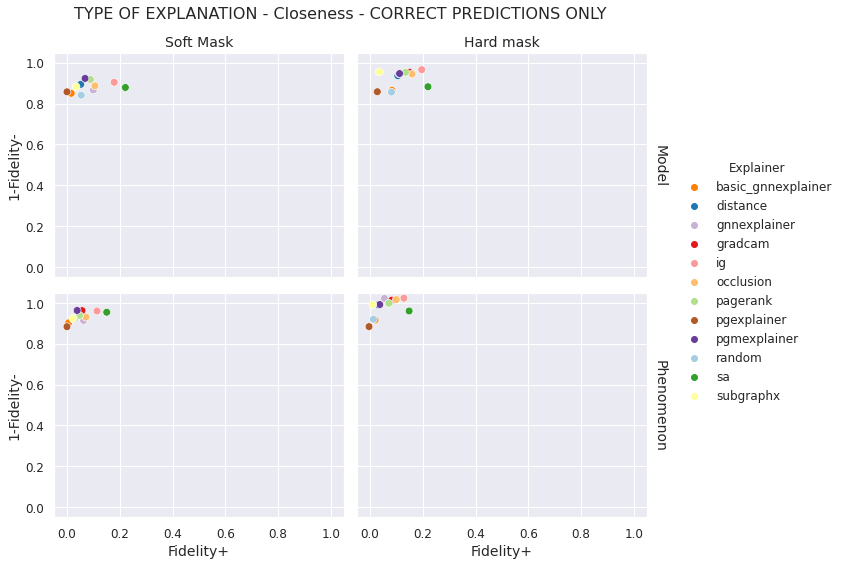

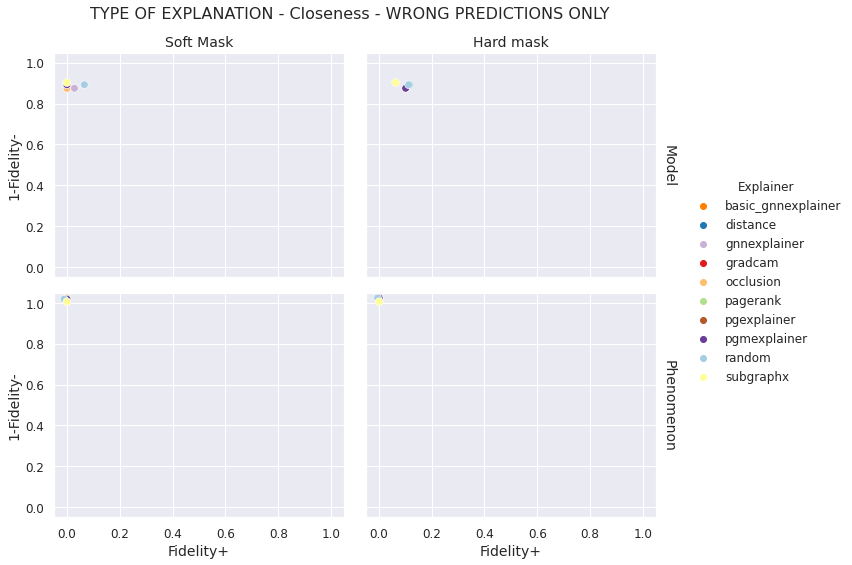

In [42]:
for pred_type in testing_pred_lst:

    df_gen = df[df['testing_pred']==pred_type].groupby(['explainer_name', "true_label_as_target", 'hard_mask']).mean()
    df_gen = df_gen.reset_index()
    df_gen['hard_mask'] = df_gen['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen['true_label_as_target'] = df_gen['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})

    g = sns.FacetGrid(df_gen, row="true_label_as_target", col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="fidelity_prob+", y="1-fidelity_prob-",
        hue="explainer_name", palette=dict_color, marker="o", s=60)#.set(xscale = 'log')
    g.fig.suptitle(f"TYPE OF EXPLANATION - Closeness - {pred_type.upper()} PREDICTIONS ONLY", fontsize=16, x=0.43)
    #g.fig.suptitle("Averaged on all real-world datasets", fontsize=12, x=0.43, y=1)

    g.set(ylim=(-0.05,1.05))
    g.set(xlim=(-0.05,1.05))
    g.add_legend(title="Explainer")
    g.fig.subplots_adjust(top=0.9)
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Fidelity+", y_var="1-Fidelity-")
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_0.99_all_prob.pdf')
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_0.99_all_prob.png')
    

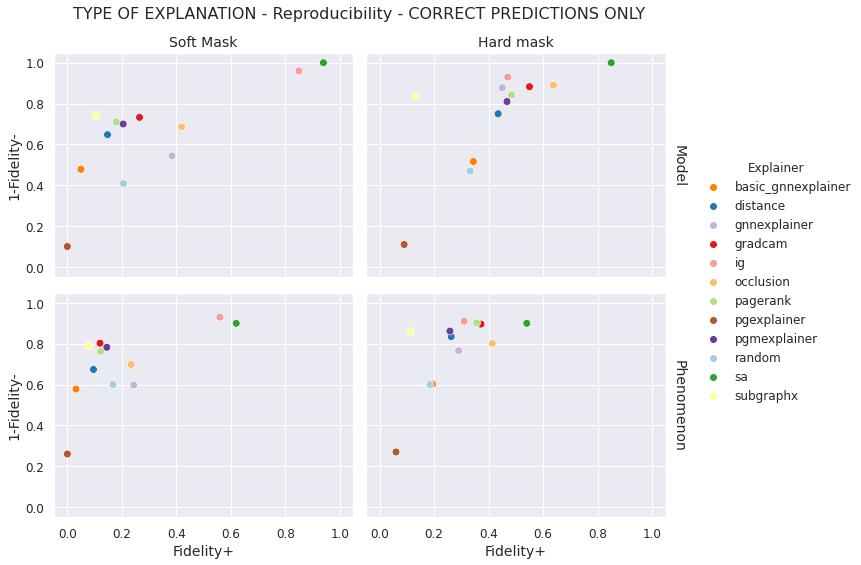

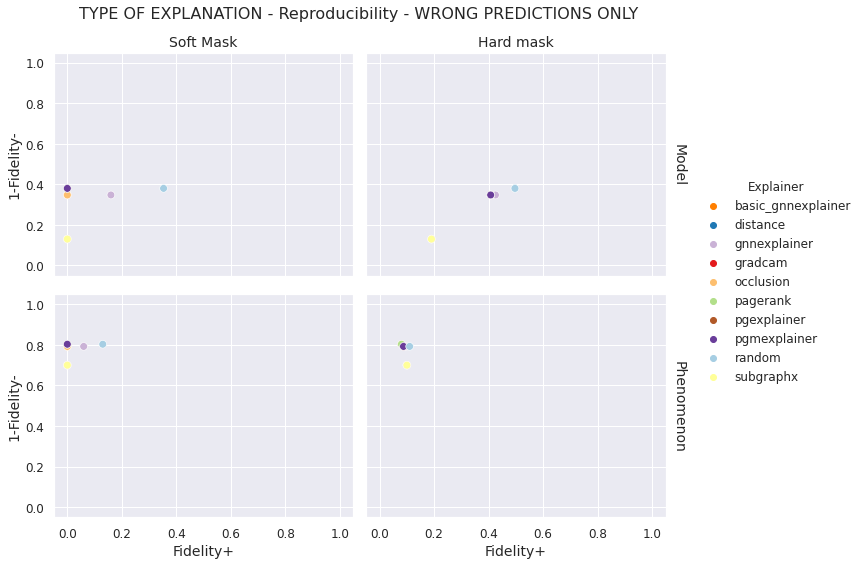

In [44]:
for pred_type in testing_pred_lst:

    df_gen = df[df['testing_pred']==pred_type].groupby(['explainer_name', "true_label_as_target", 'hard_mask']).mean()
    df_gen = df_gen.reset_index()
    df_gen['hard_mask'] = df_gen['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen['true_label_as_target'] = df_gen['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})

    g = sns.FacetGrid(df_gen, row="true_label_as_target", col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="fidelity_acc+", y="1-fidelity_acc-",
        hue="explainer_name", palette=dict_color, marker="o", s=60)#.set(xscale = 'log')
    g.fig.suptitle(f"TYPE OF EXPLANATION - Reproducibility - {pred_type.upper()} PREDICTIONS ONLY", fontsize=16, x=0.43)
    #g.fig.suptitle("Averaged on all real-world datasets", fontsize=12, x=0.43, y=1)

    g.set(ylim=(-0.05,1.05))
    g.set(xlim=(-0.05,1.05))
    g.add_legend(title="Explainer")
    g.fig.subplots_adjust(top=0.9)
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Fidelity+", y_var="1-Fidelity-")
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_0.99_all_prob.pdf')
    #g.savefig('/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_0.99_all_prob.png')
    

## Each dataset

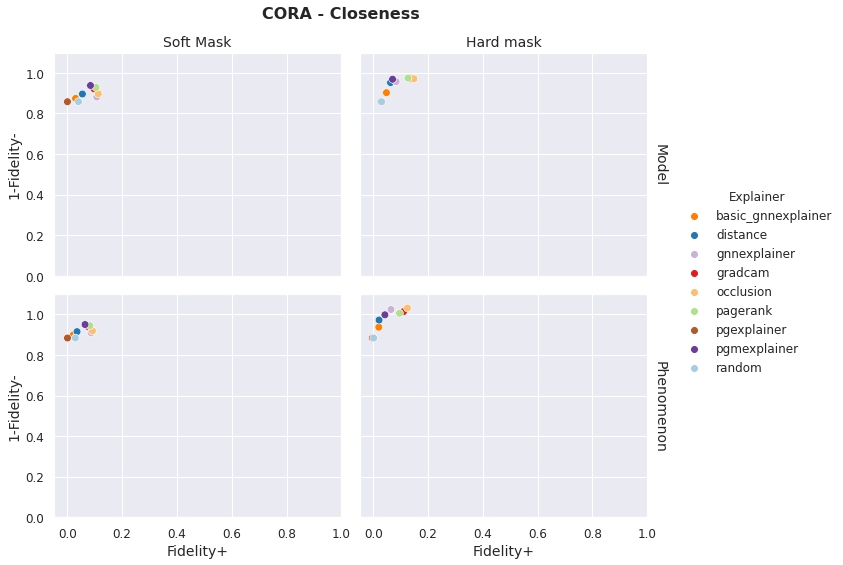

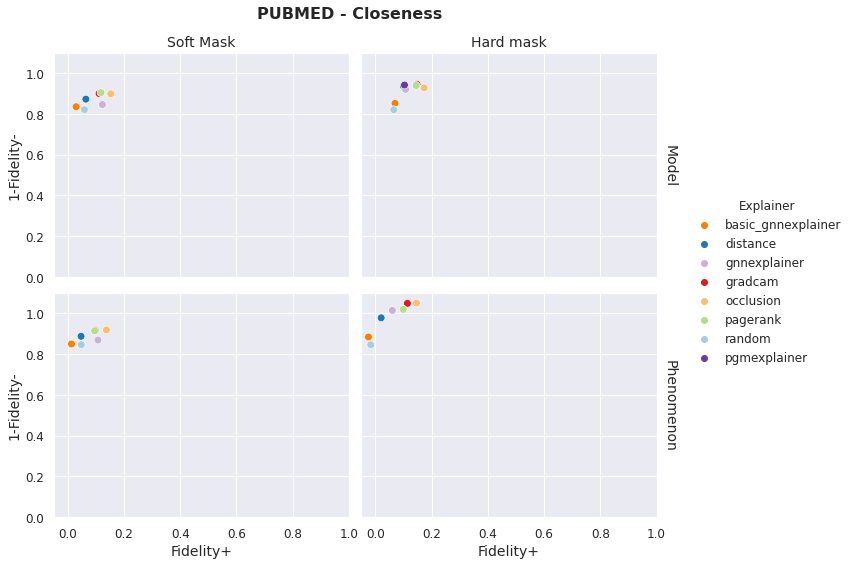

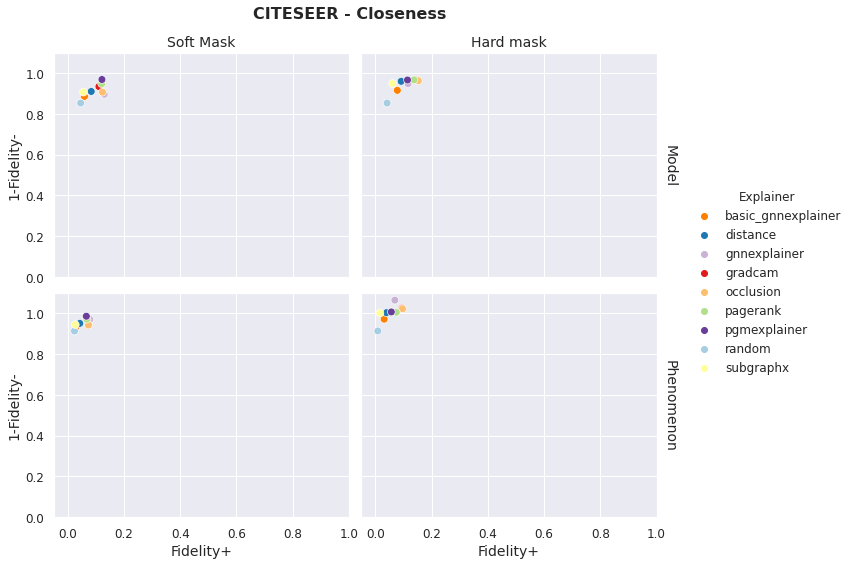

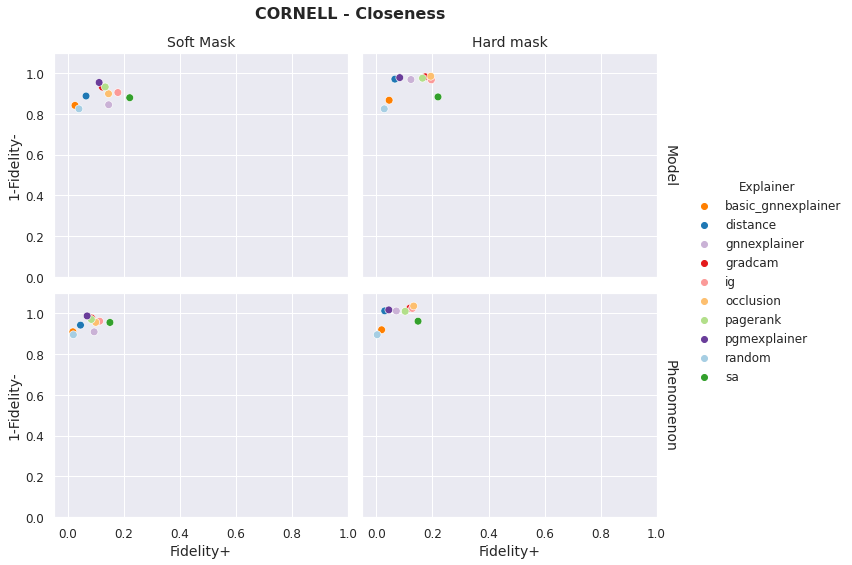

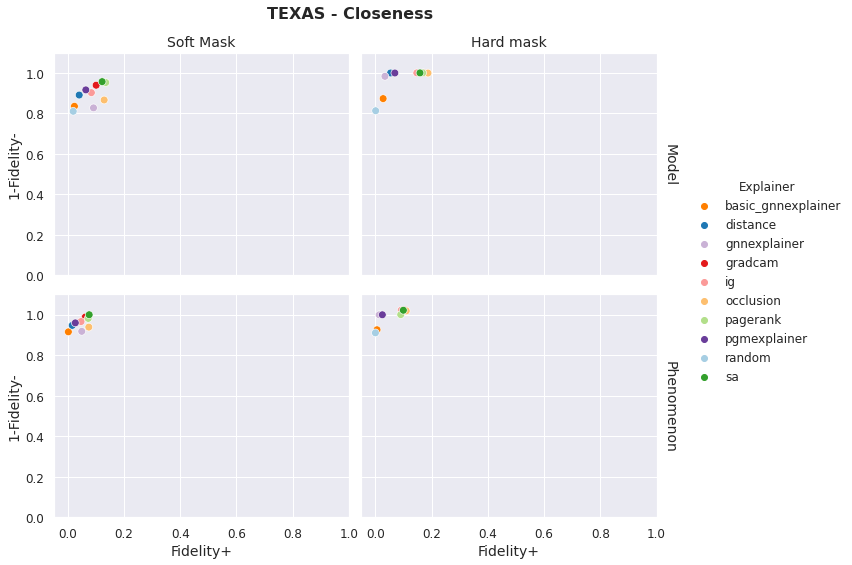

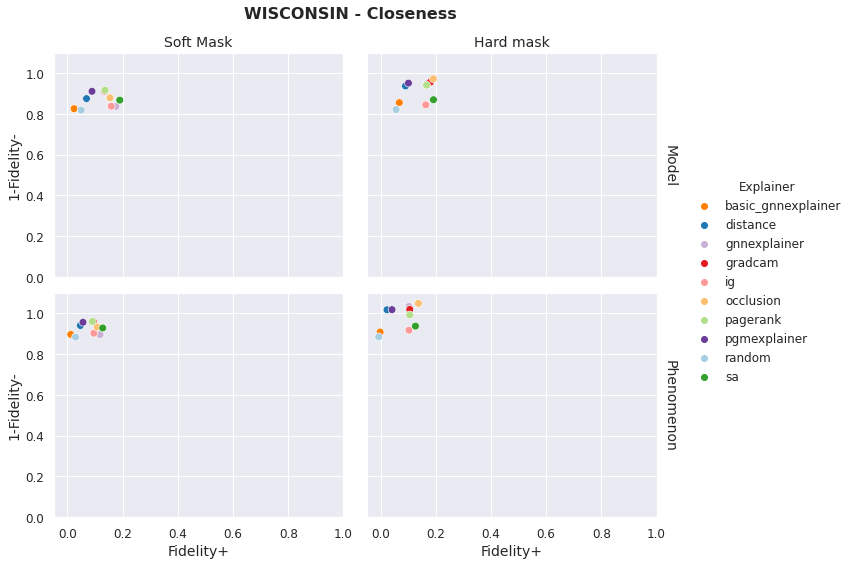

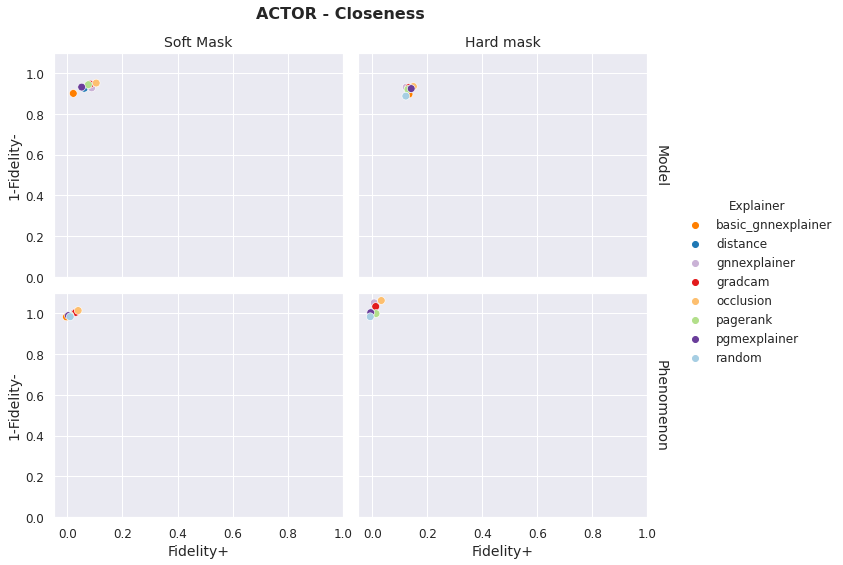

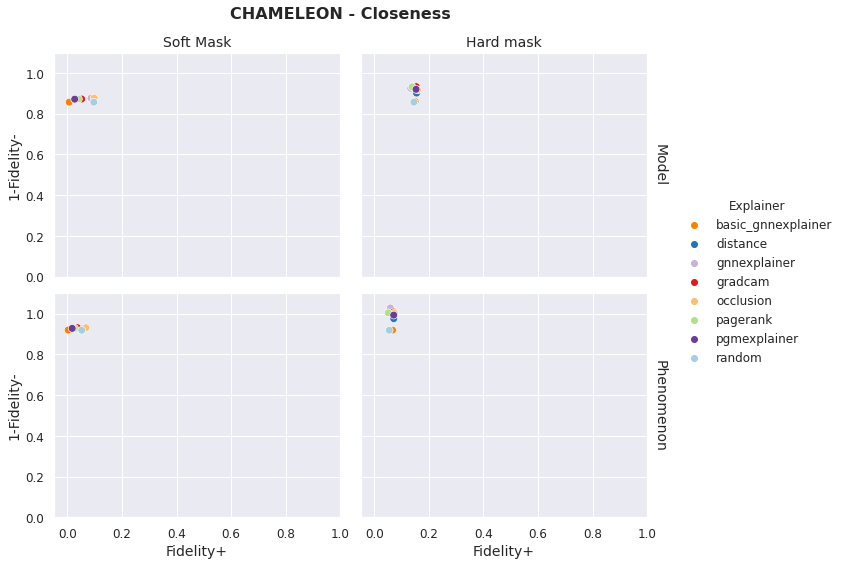

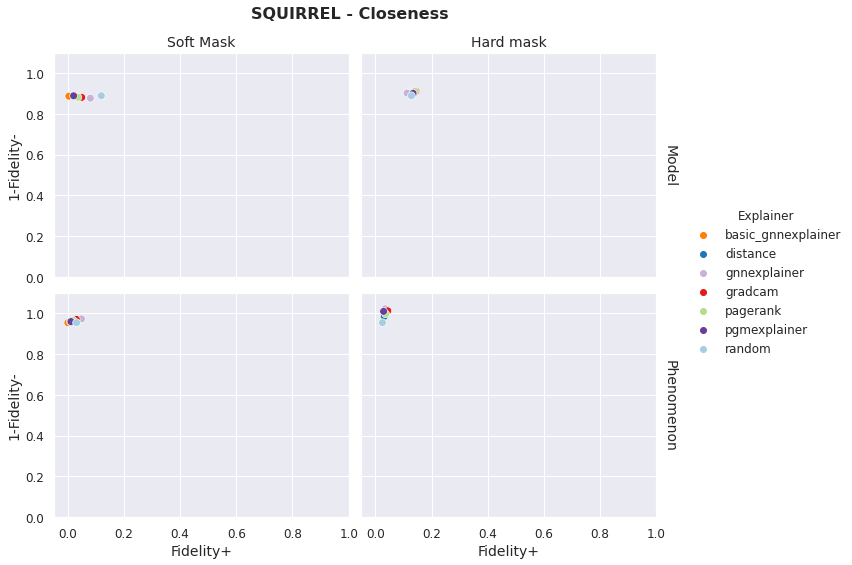

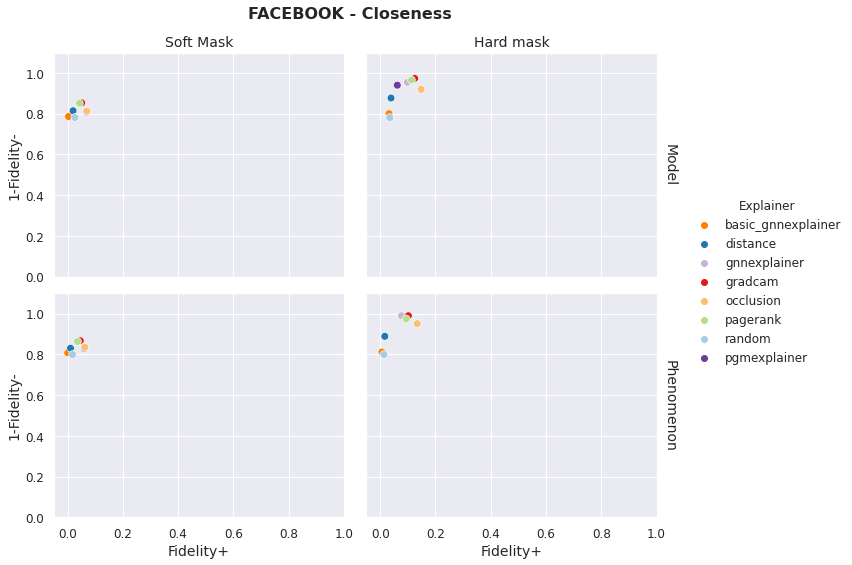

In [229]:
for data in datasets:
    df_gen_data = df[df['dataset']==data].groupby(['explainer_name', 'true_label_as_target', 'hard_mask']).mean()
    df_gen_data = df_gen_data.reset_index()
    df_gen_data['hard_mask'] = df_gen_data['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen_data['true_label_as_target'] = df_gen_data['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})
    
    g = sns.FacetGrid(df_gen_data, row='true_label_as_target', col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="fidelity_prob+", y="1-fidelity_prob-",
        hue="explainer_name", palette=dict_color, marker="o", s=60)
    g.set(ylim=(0,1.1))
    g.set(xlim=(-0.05,1))
    g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
    g.fig.suptitle(data.upper()+' - Closeness', fontsize=16, weight='bold', x=0.43)
    g.add_legend(title="Explainer")
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Fidelity+", y_var="1-Fidelity-")
    
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_k10_{data}_prob.pdf')
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_k10_{data}_prob.png')


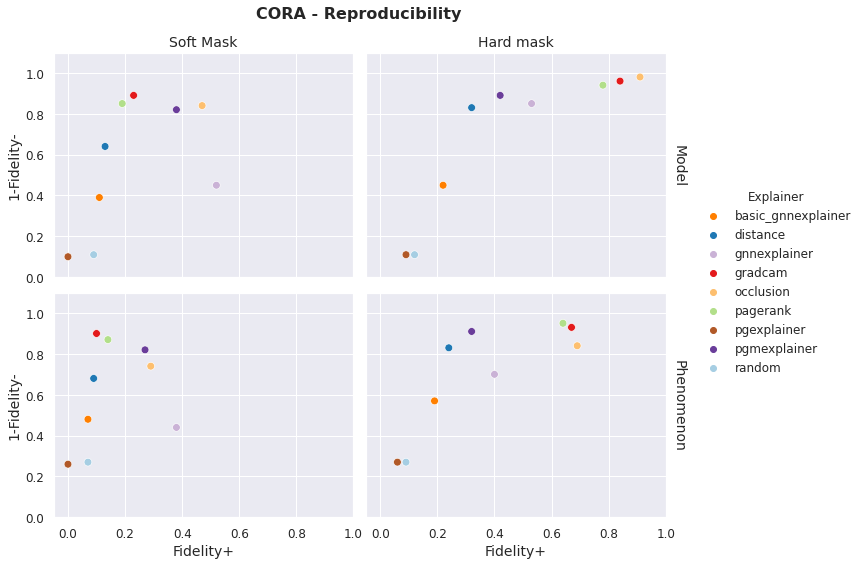

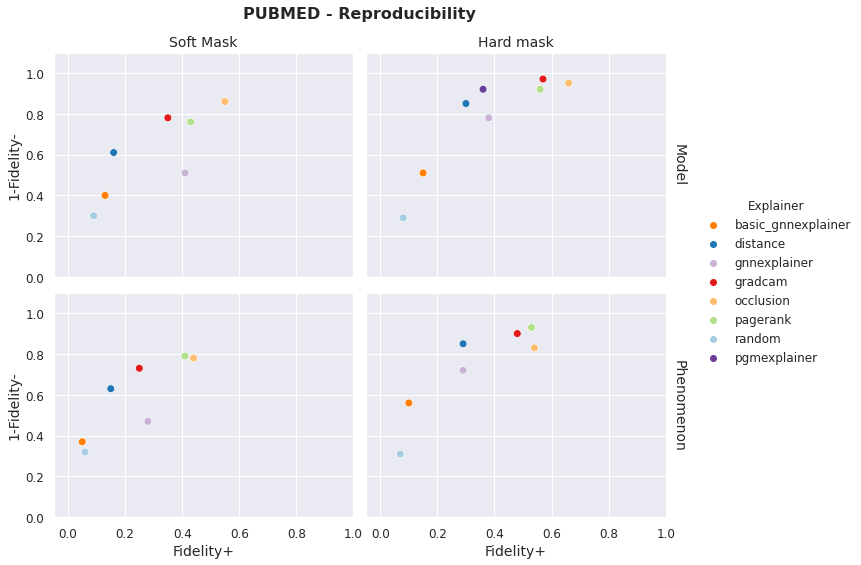

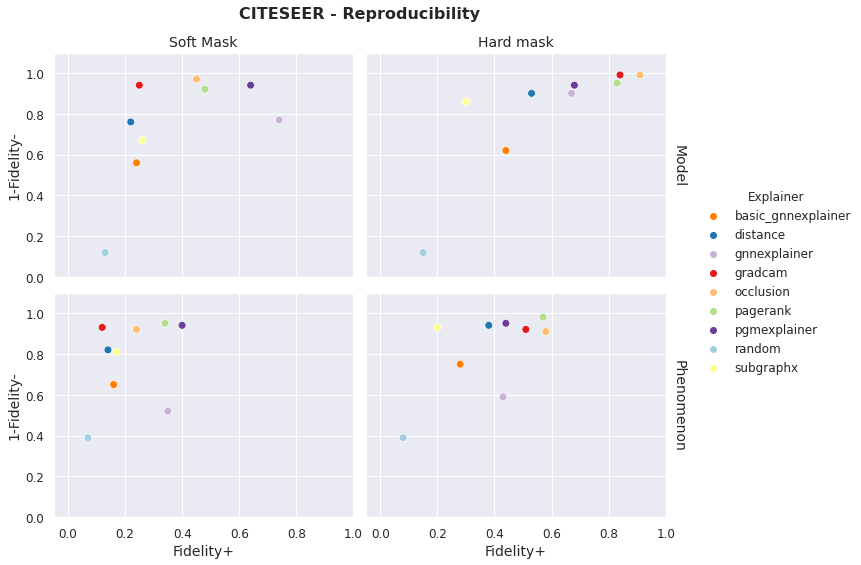

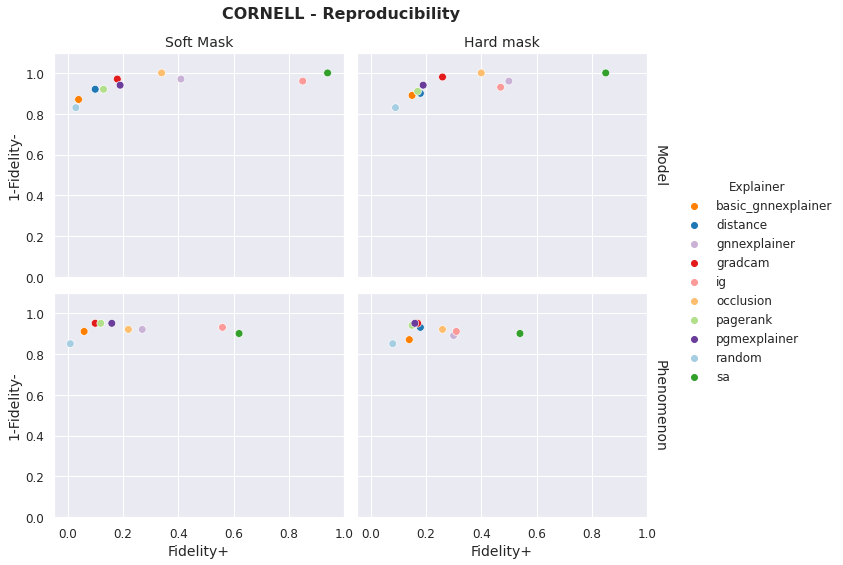

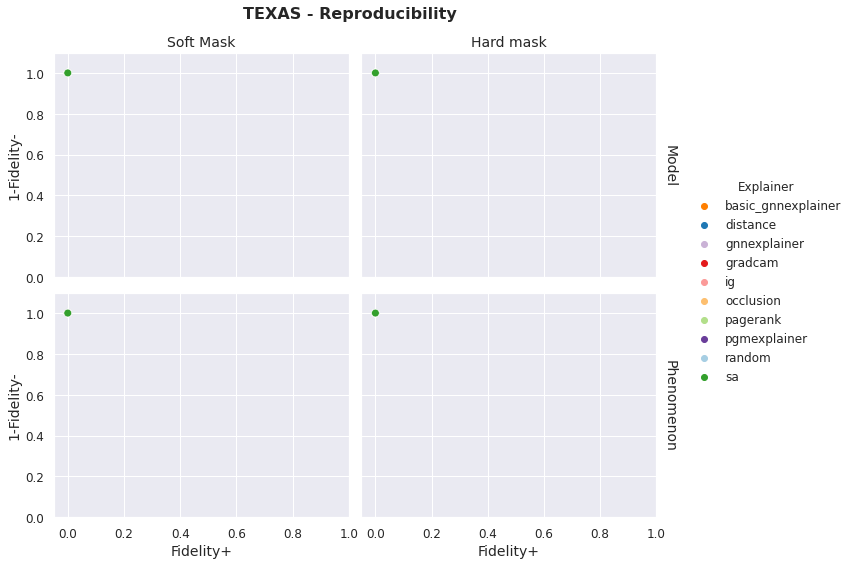

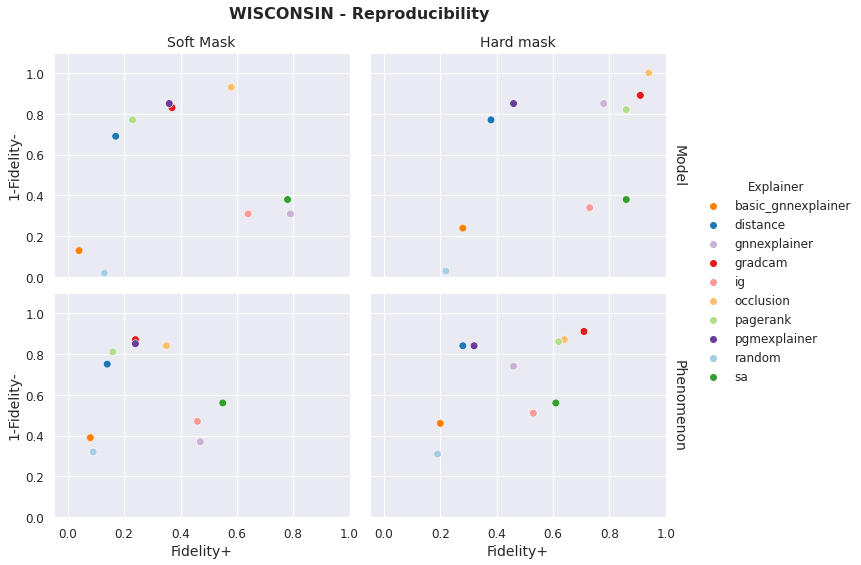

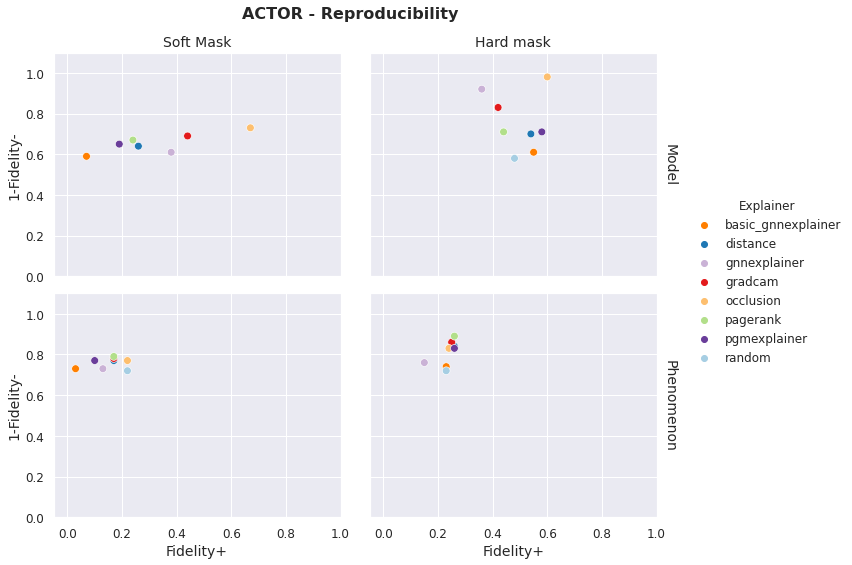

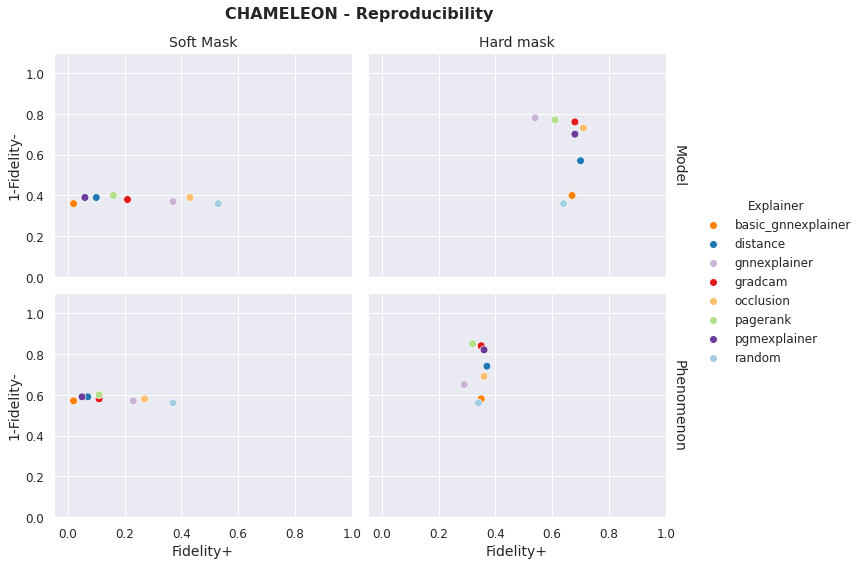

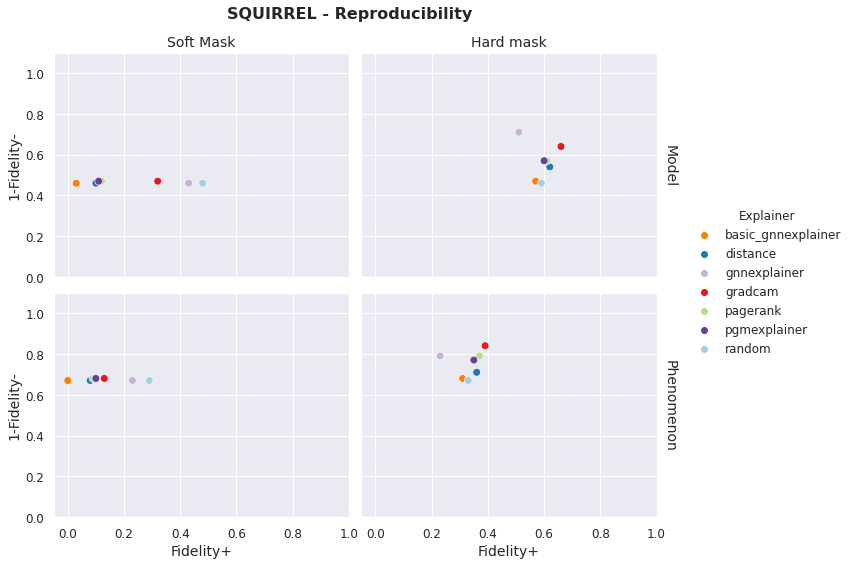

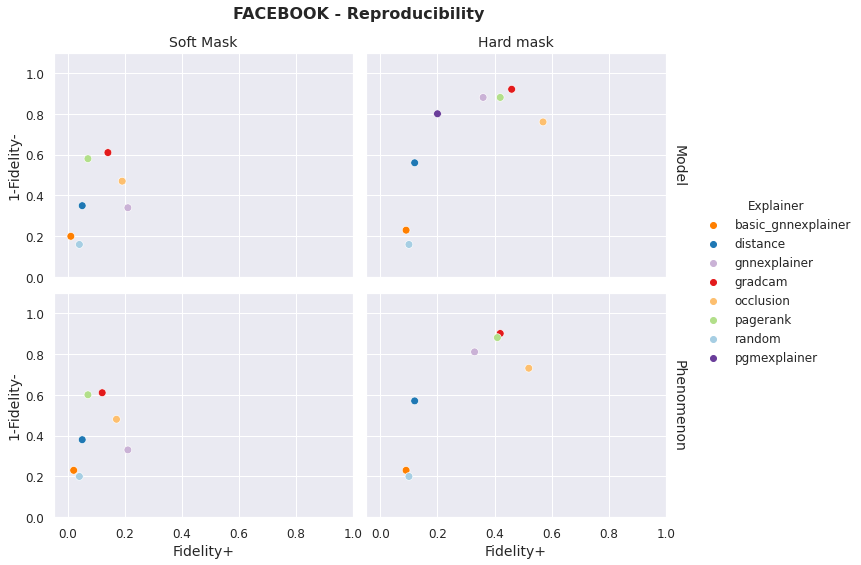

In [230]:
for data in datasets:
    df_gen_data = df[df['dataset']==data].groupby(['explainer_name', 'true_label_as_target', 'hard_mask']).mean()
    df_gen_data = df_gen_data.reset_index()
    df_gen_data['hard_mask'] = df_gen_data['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen_data['true_label_as_target'] = df_gen_data['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})
    
    g = sns.FacetGrid(df_gen_data, row='true_label_as_target', col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="fidelity_acc+", y="1-fidelity_acc-",
        hue="explainer_name", palette=dict_color, marker="o", s=60)
    g.set(ylim=(0,1.1))
    g.set(xlim=(-0.05,1))
    g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
    g.fig.suptitle(data.upper()+' - Reproducibility', fontsize=16, weight='bold', x=0.43)
    g.add_legend(title="Explainer")
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Fidelity+", y_var="1-Fidelity-")
    
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_k10_{data}_prob.pdf')
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/expl_type/fig_expl_type_k10_{data}_prob.png')


# Mask properties vs Performance 
Sparsity = 0 bc we are interested in the initial masks (without transformation)

In [231]:
df = df_res[df_res['topk']==100]
#df = df_res

In [232]:
sns.set_context("notebook", rc={"legend.fontsize":12, "legend.title_fontsize":12, 
                                "axes.titlesize":14,"axes.labelsize":14,
                               "xtick.labelsize" : 12, "ytick.labelsize" : 12})


In [233]:
datasets = [
      "cora",
      "pubmed",
      "citeseer",
      "cornell",
      "texas",
      "wisconsin",
      "actor",
      "chameleon",
    "squirrel",
    "facebook"
    ]


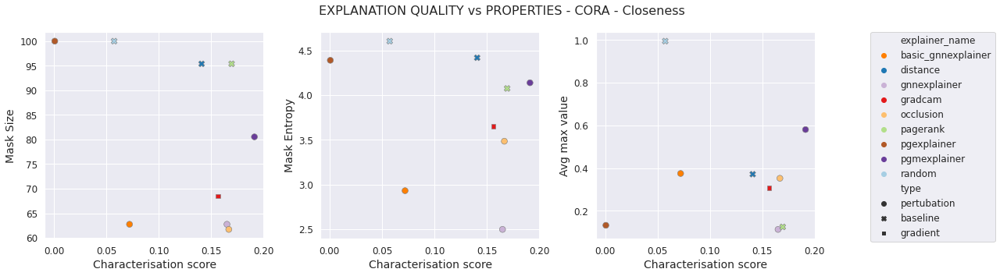

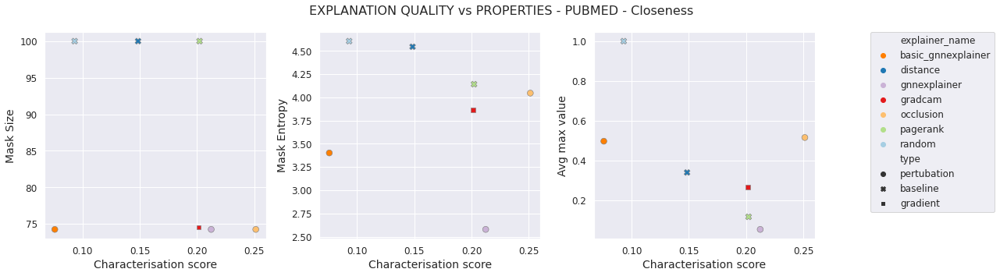

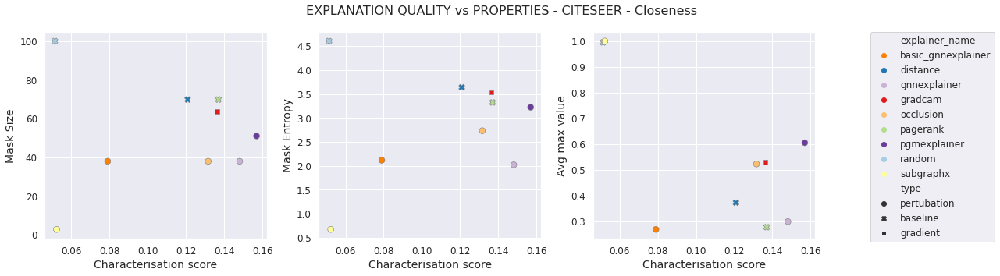

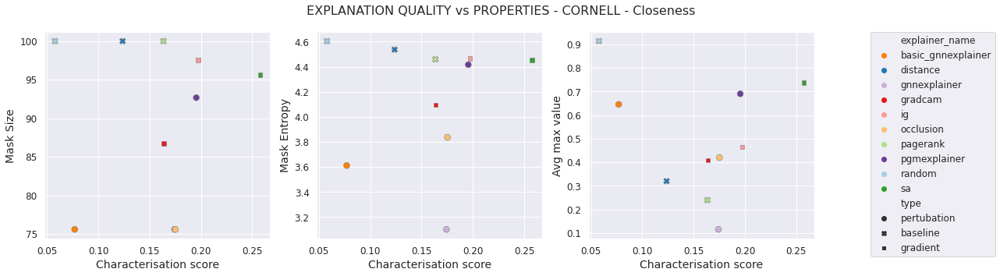

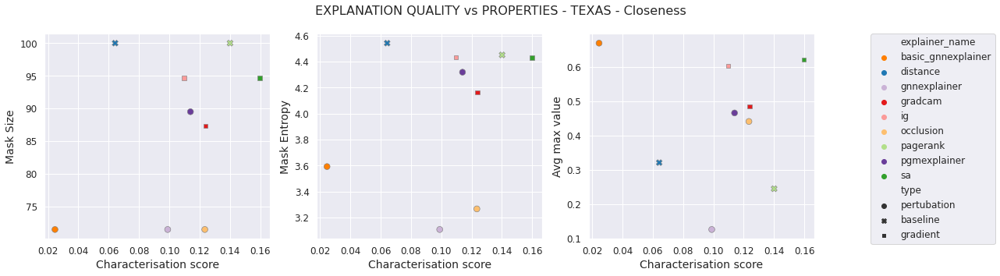

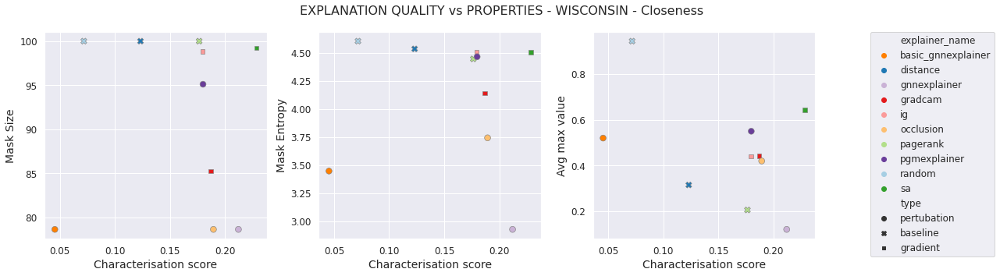

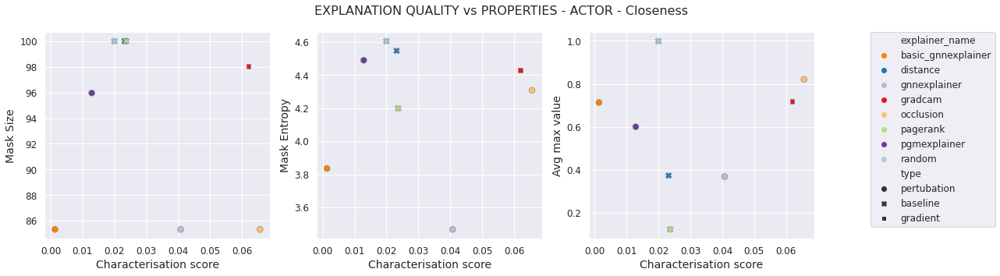

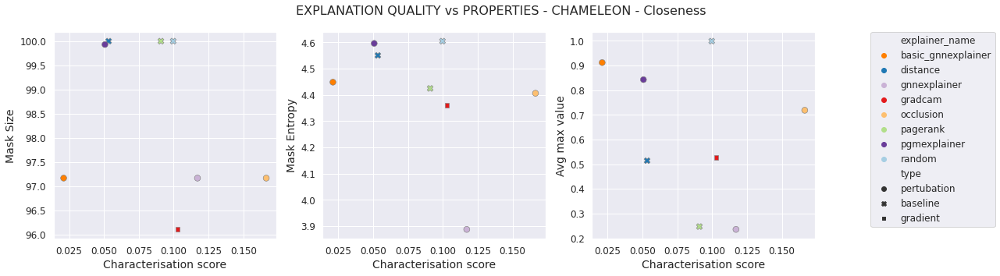

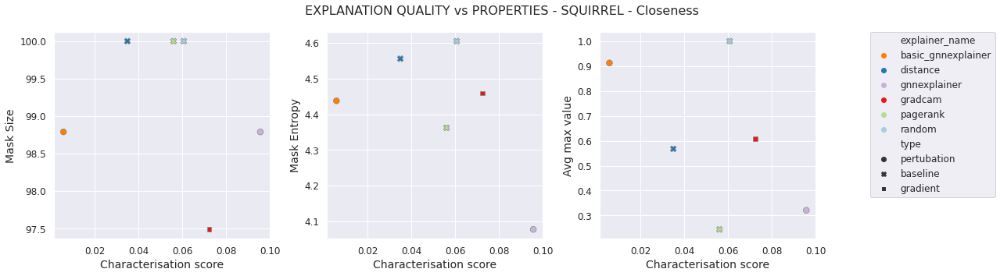

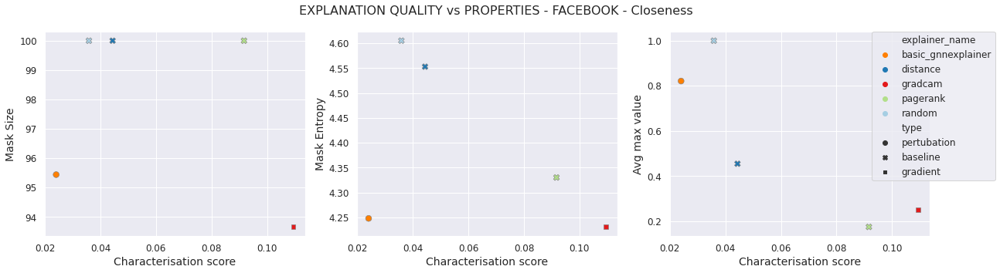

In [234]:
for data in datasets:
    df_mask_data = df[(df['dataset']==data)&(df['true_label_as_target']==True)&(df['hard_mask']==False)]
    fig, axs = plt.subplots(1,3, figsize=(18, 5), sharex=True)
    
    g1 = sns.scatterplot(data =df_mask_data, x="charact_prob", y="mask_size_transf",
        hue="explainer_name", palette=dict_color, marker="o", s=60, style="type", alpha =1, edgecolor="grey", ax = axs[0], legend=False)
    axs[0].set_ylabel('Mask Size')
    axs[0].set_xlabel('Characterisation score')
    
    g2 = sns.scatterplot(data =df_mask_data, x="charact_prob", y="mask_entropy_transf",
        hue="explainer_name", palette=dict_color, marker="o", s=60, style="type", alpha =1, edgecolor="grey", ax = axs[1], legend=False)
    axs[1].set_ylabel('Mask Entropy')
    axs[1].set_xlabel('Characterisation score')
    
    g3 = sns.scatterplot(data =df_mask_data, x="charact_prob", y="max_avg_transf",
        hue="explainer_name", palette=dict_color, marker="o", s=60, style="type", alpha =1, edgecolor="grey", ax = axs[2])
    axs[2].set_ylabel('Avg max value')
    axs[2].set_xlabel('Characterisation score')
    
    # produce a legend with the unique colors from the scatter
    plt.legend(bbox_to_anchor=(1.25, 1), borderaxespad=0)
    fig.suptitle('EXPLANATION QUALITY vs PROPERTIES - '+data.upper()+' - Closeness', fontsize=16)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    #fig.savefig(f'/cluster/home/kamara/Explain/figures/topk/charact_vs_properties/fig_mask_prop_{data}_prob.pdf')
    #fig.savefig(f'/cluster/home/kamara/Explain/figures/topk/charact_vs_properties/fig_mask_prop_{data}_prob.png')


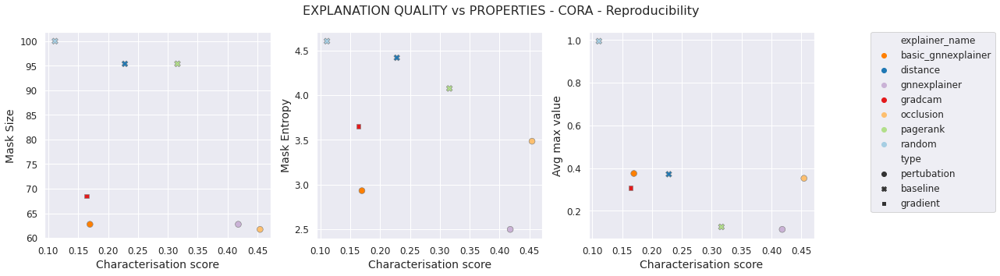

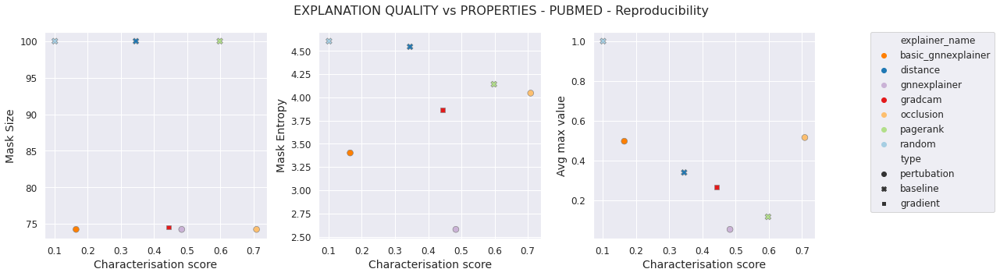

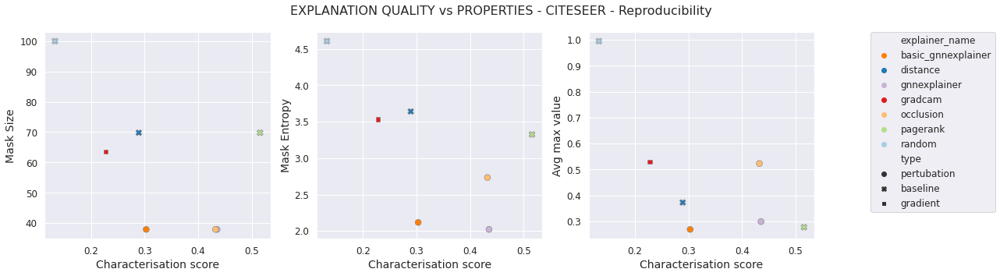

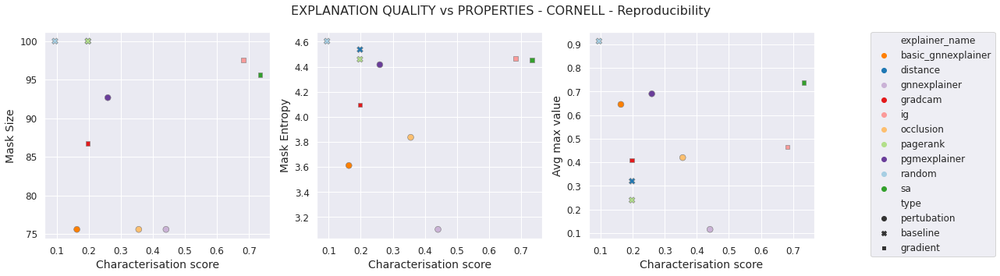

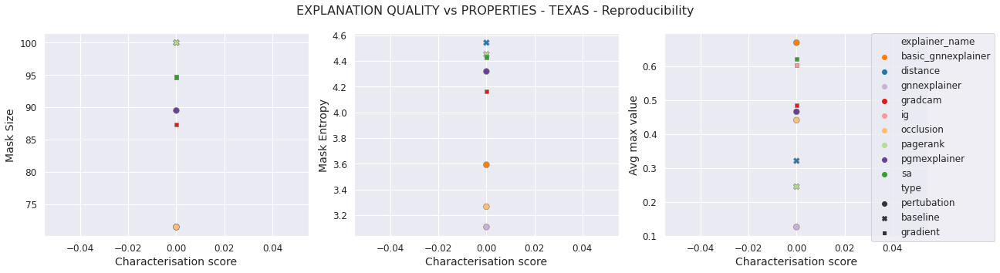

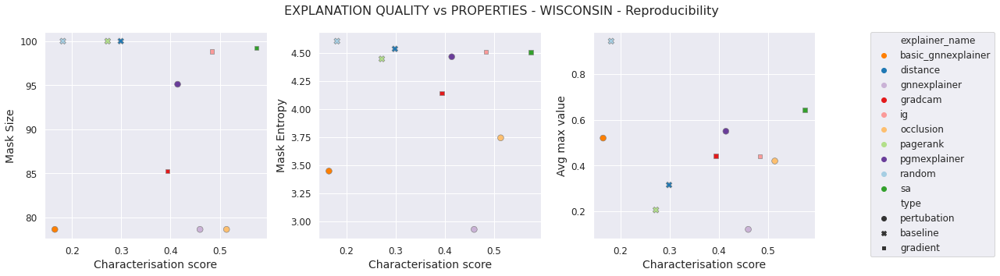

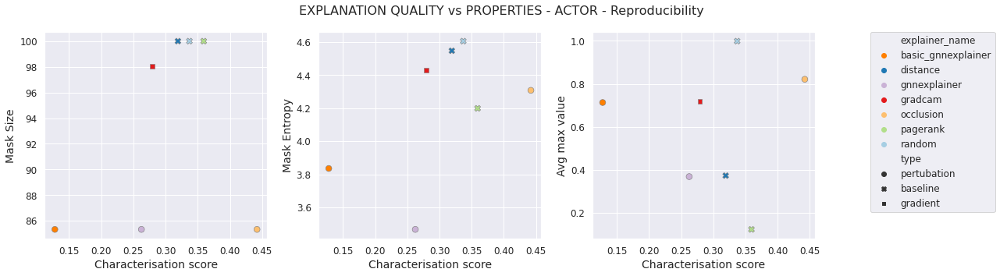

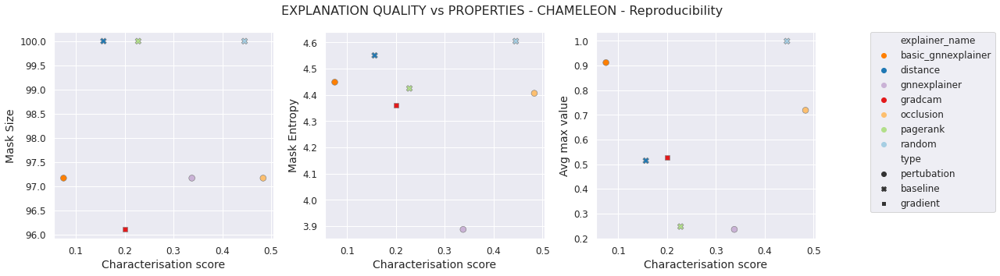

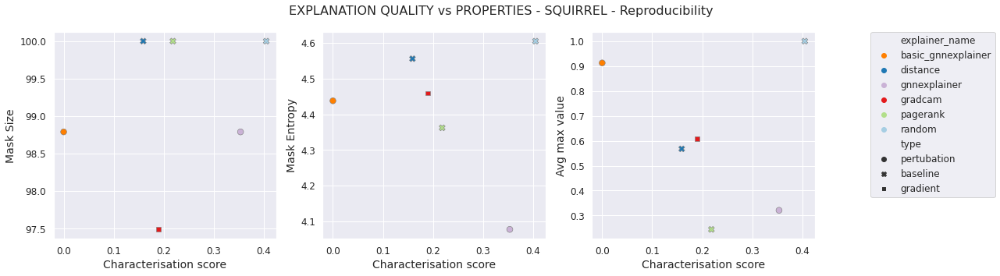

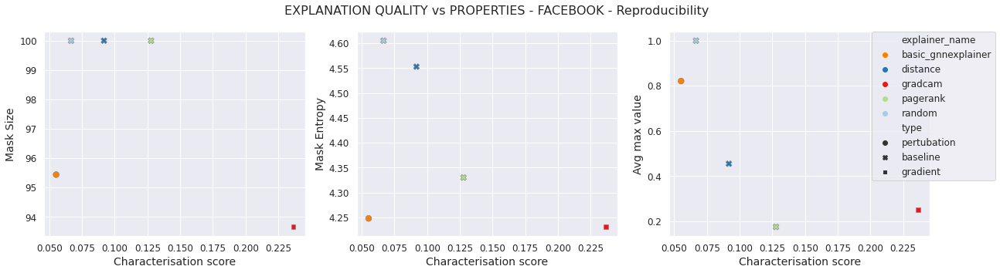

In [109]:
for data in datasets:
    df_mask_data = df[(df['dataset']==data)&(df['true_label_as_target']==True)&(df['hard_mask']==False)]
    fig, axs = plt.subplots(1,3, figsize=(18, 5), sharex=True)
    
    g1 = sns.scatterplot(data =df_mask_data, x="charact_acc", y="mask_size_transf",
        hue="explainer_name", palette=dict_color, marker="o", s=60, style="type", alpha =1, edgecolor="grey", ax = axs[0], legend=False)
    axs[0].set_ylabel('Mask Size')
    axs[0].set_xlabel('Characterisation score')
    
    g2 = sns.scatterplot(data =df_mask_data, x="charact_acc", y="mask_entropy_transf",
        hue="explainer_name", palette=dict_color, marker="o", s=60, style="type", alpha =1, edgecolor="grey", ax = axs[1], legend=False)
    axs[1].set_ylabel('Mask Entropy')
    axs[1].set_xlabel('Characterisation score')
    
    g3 = sns.scatterplot(data =df_mask_data, x="charact_acc", y="max_avg_transf",
        hue="explainer_name", palette=dict_color, marker="o", s=60, style="type", alpha =1, edgecolor="grey", ax = axs[2])
    axs[2].set_ylabel('Avg max value')
    axs[2].set_xlabel('Characterisation score')
    
    # produce a legend with the unique colors from the scatter
    plt.legend(bbox_to_anchor=(1.25, 1), borderaxespad=0)
    fig.suptitle('EXPLANATION QUALITY vs PROPERTIES - '+data.upper()+' - Reproducibility', fontsize=16)
    plt.grid(True)
    plt.tight_layout()
    plt.show()
    #fig.savefig(f'/cluster/home/kamara/Explain/figures/topk/charact_vs_properties/fig_mask_prop_{data}_acc.pdf')
    #fig.savefig(f'/cluster/home/kamara/Explain/figures/topk/charact_vs_properties/fig_mask_prop_{data}_acc.png')


# Closeness vs Reproducibility

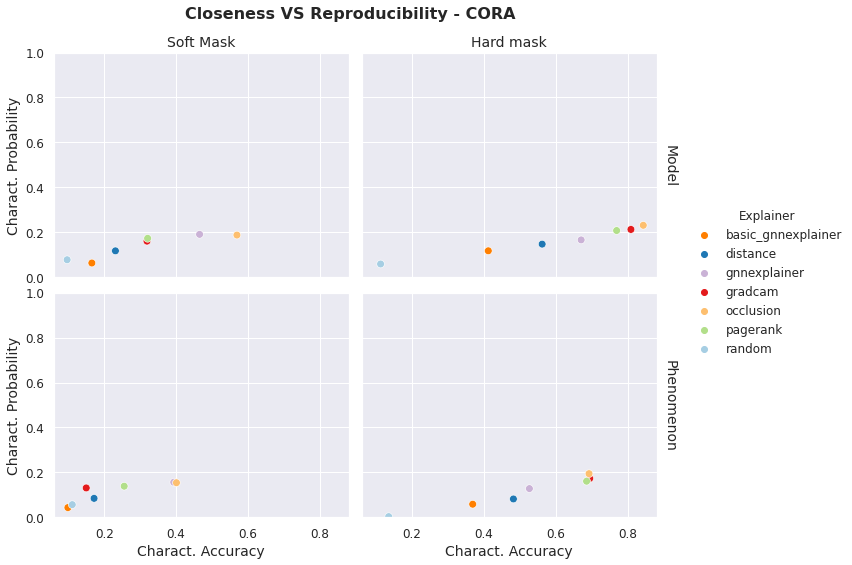

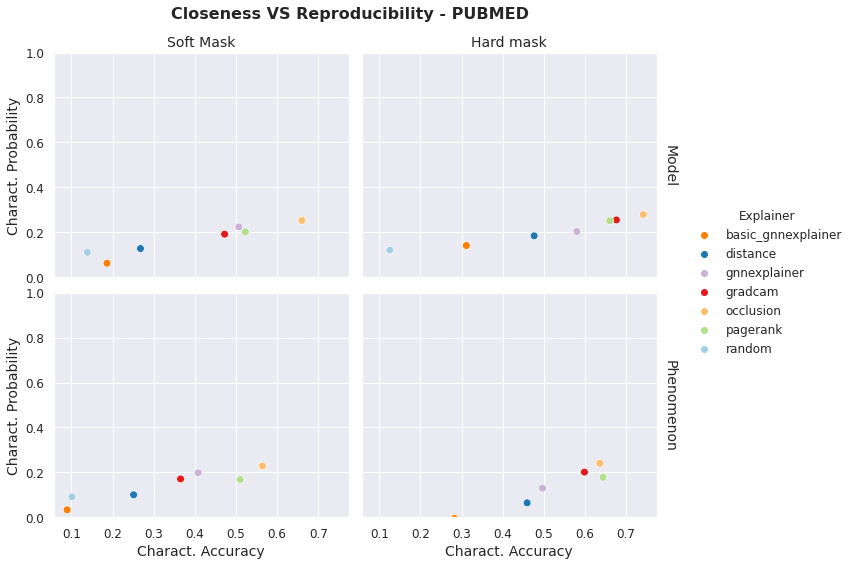

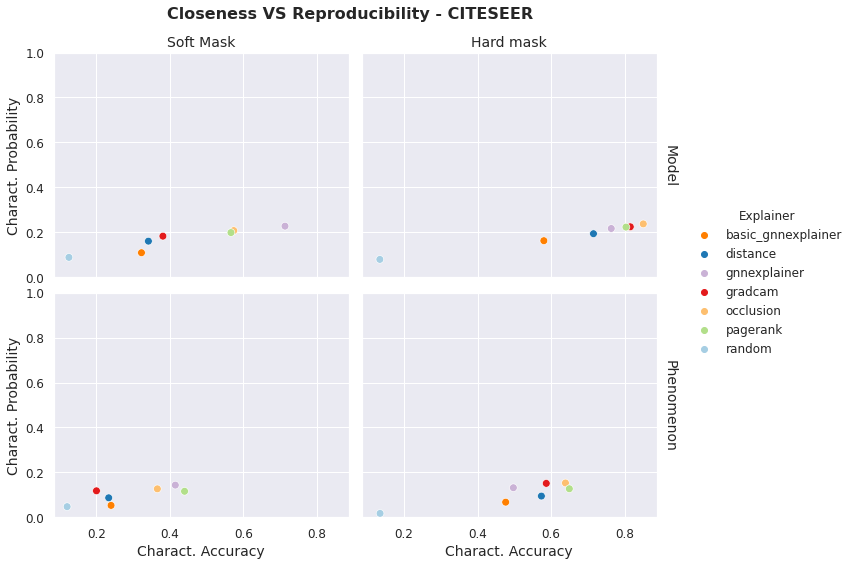

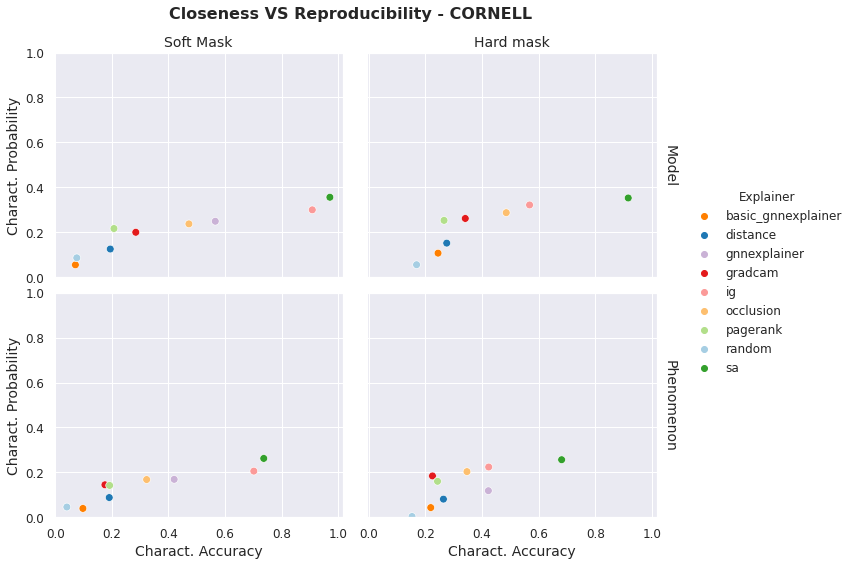

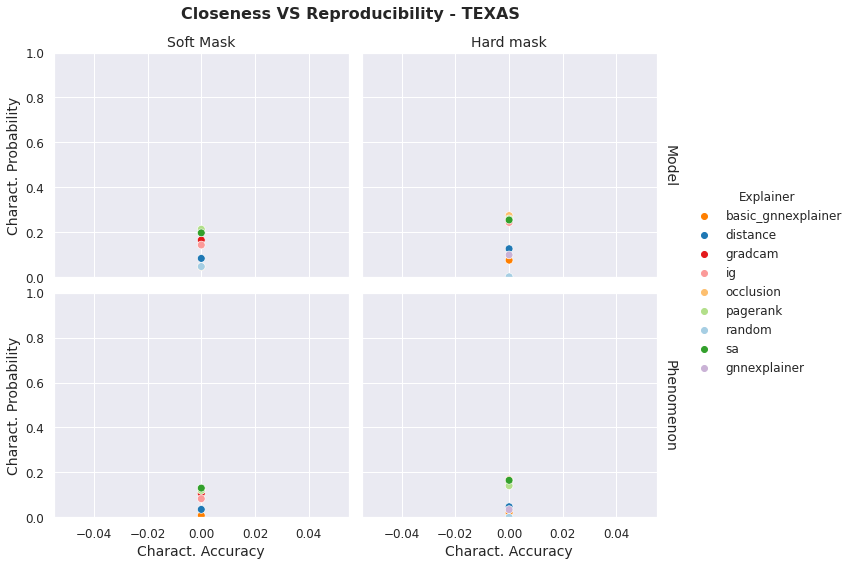

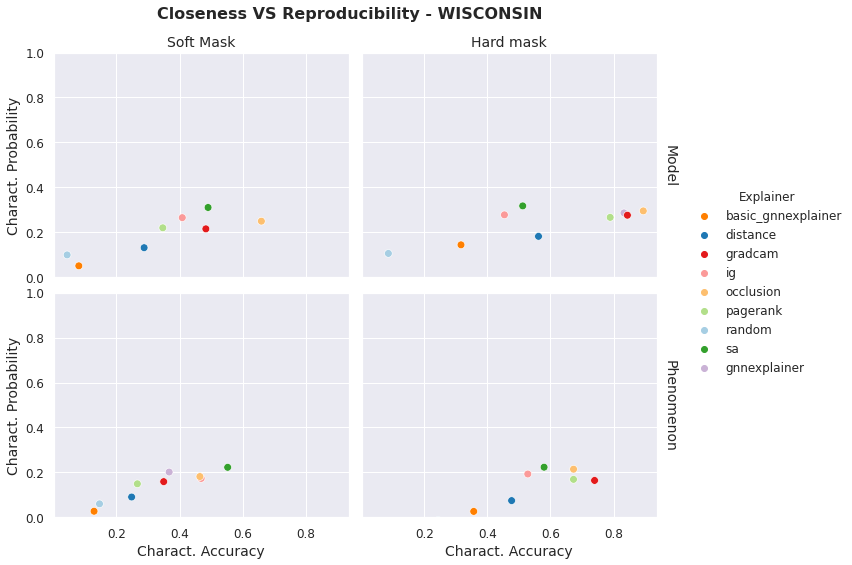

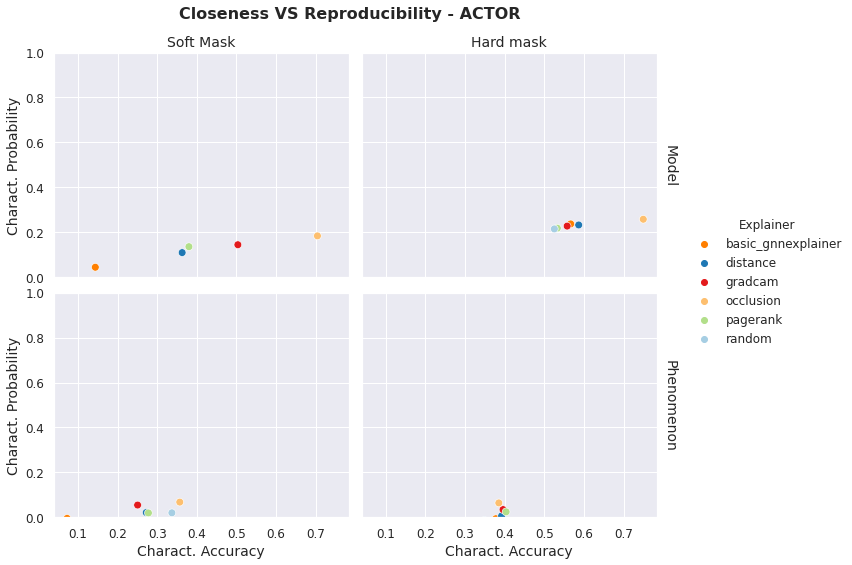

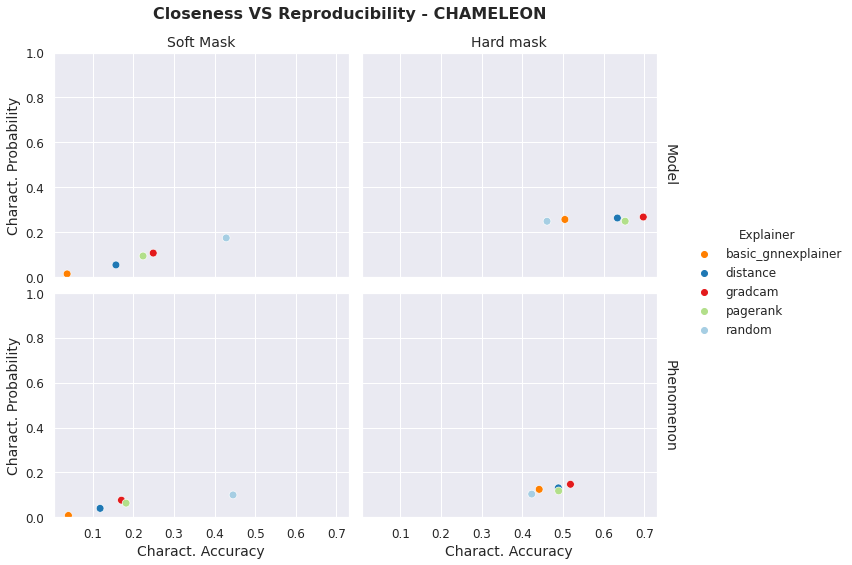

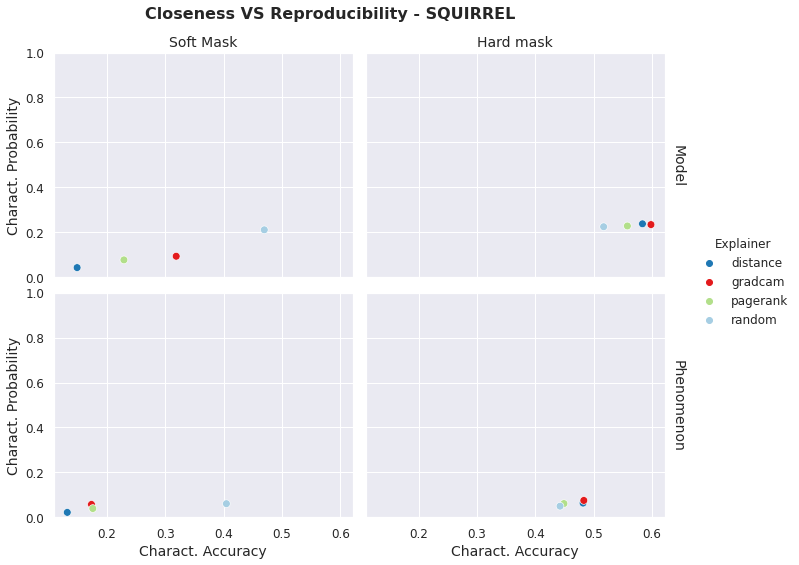

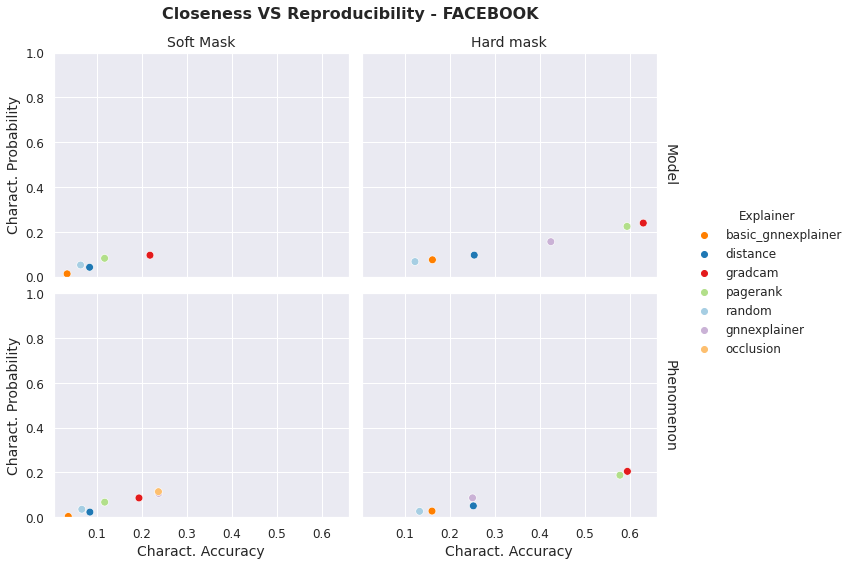

In [58]:
for data in datasets:
    df_gen_data = df_res[df_res['dataset']==data].groupby(['explainer_name', 'true_label_as_target', 'hard_mask']).mean()
    df_gen_data = df_gen_data.reset_index()
    df_gen_data['hard_mask'] = df_gen_data['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen_data['true_label_as_target'] = df_gen_data['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})
    
    g = sns.FacetGrid(df_gen_data, row='true_label_as_target', col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.scatterplot, x="charact_acc", y="charact_prob",
        hue="explainer_name", palette=dict_color, marker="o", s=60)
    g.set(ylim=(0,1))
    g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
    g.fig.suptitle('Closeness VS Reproducibility - '+data.upper(), fontsize=16, weight='bold', x=0.43)
    g.add_legend(title="Explainer")
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="Charact. Accuracy", y_var="Charact. Probability")
    
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/prob_vs_acc/fig_prob_vs_acc_{data}.pdf')
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/prob_vs_acc/fig_prob_vs_acc_{data}.png')


# Consistency - Performance vs Sparsity

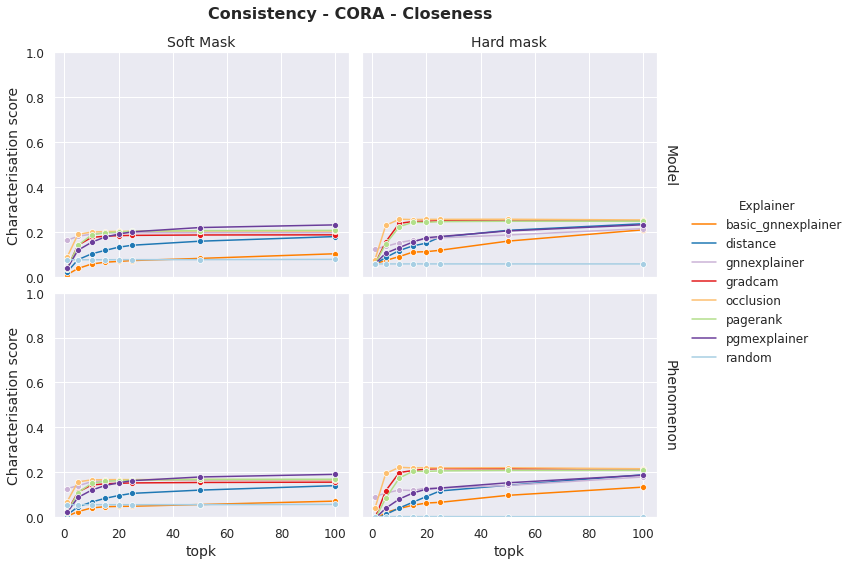

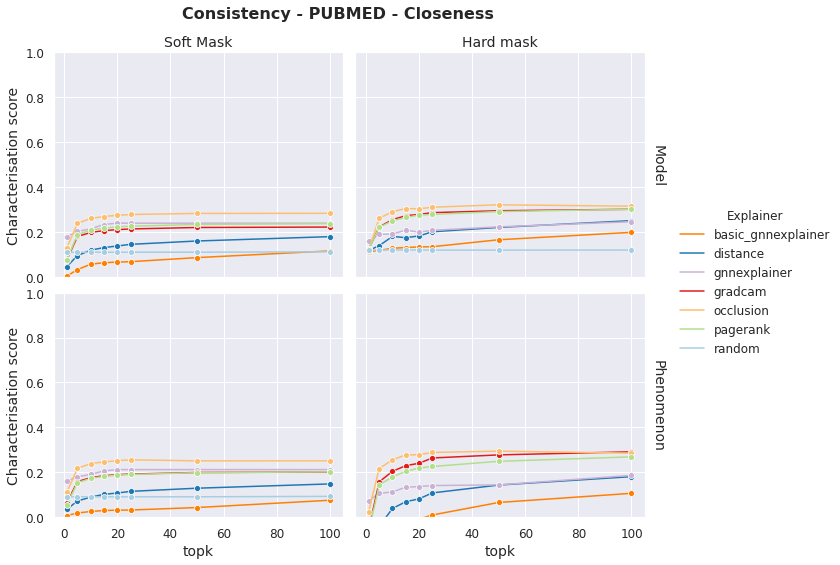

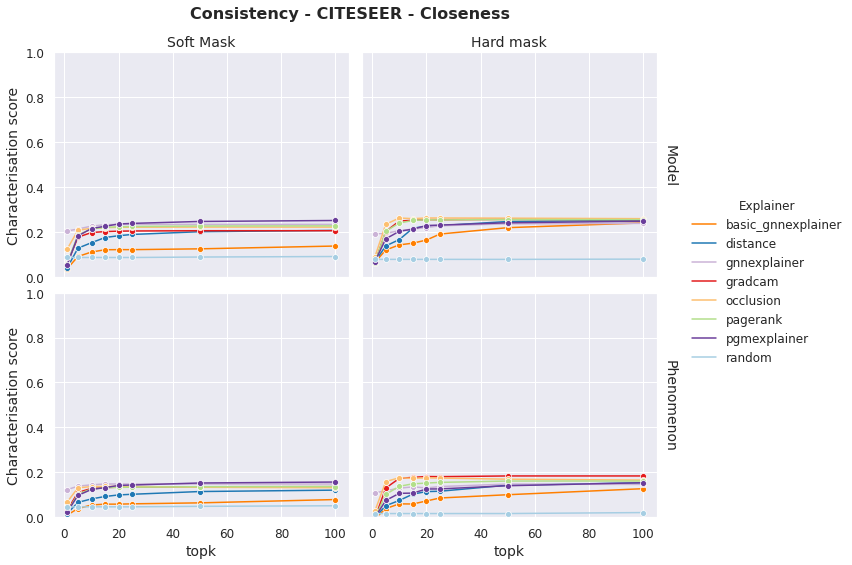

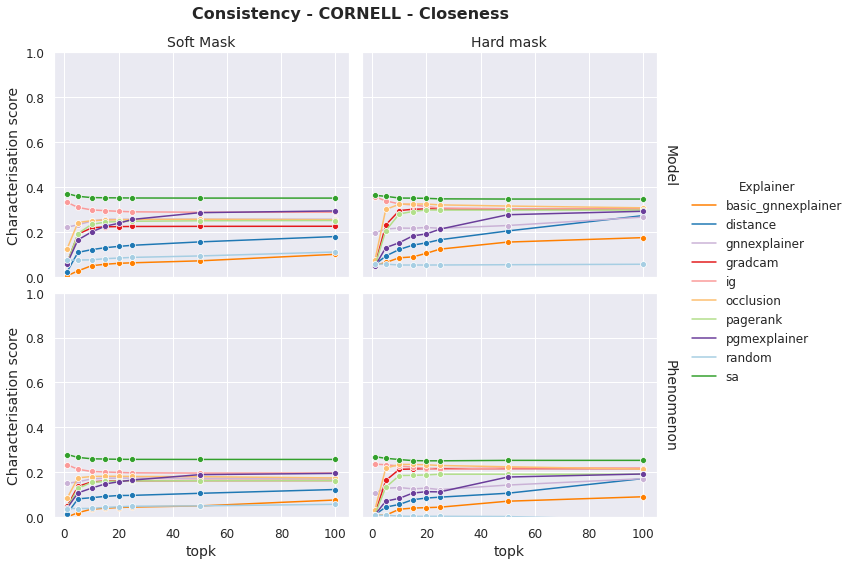

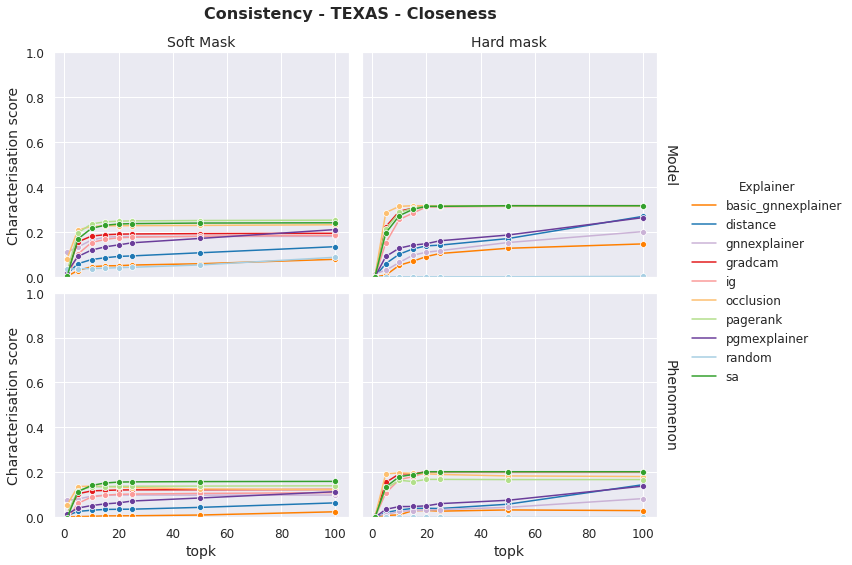

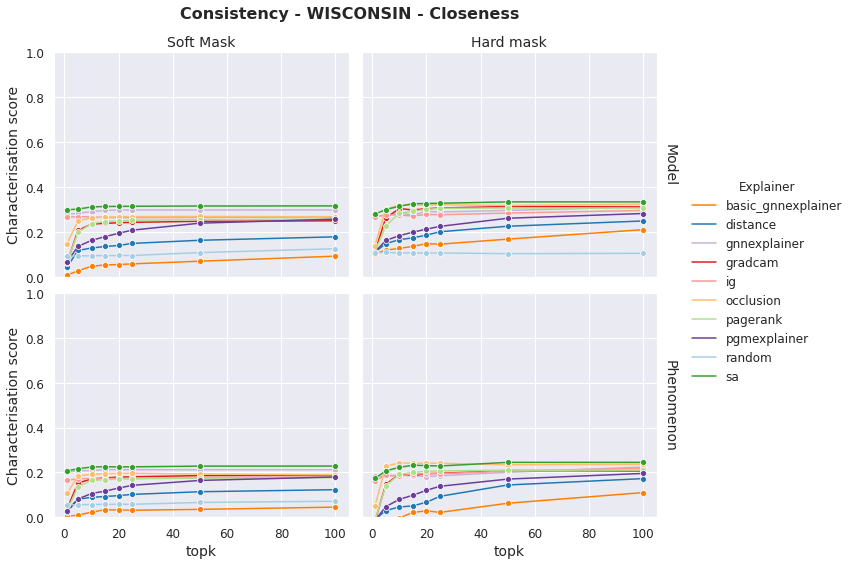

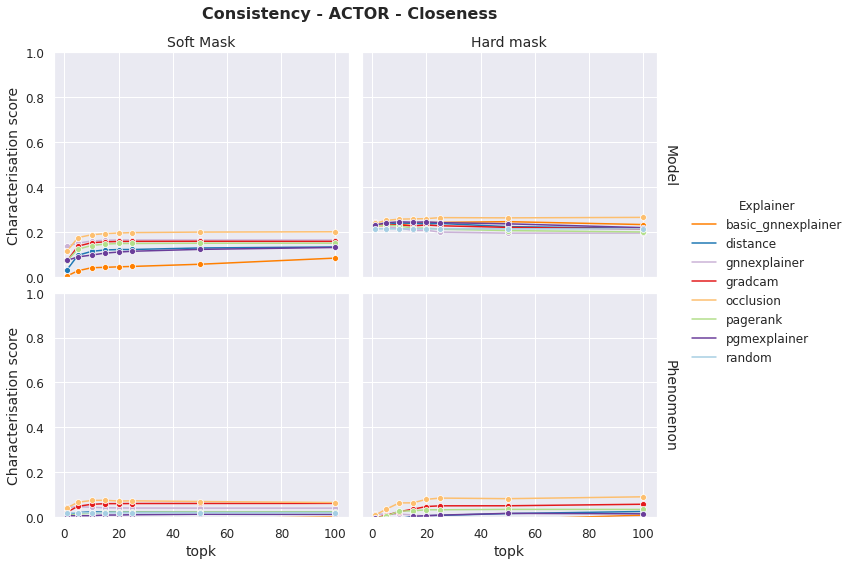

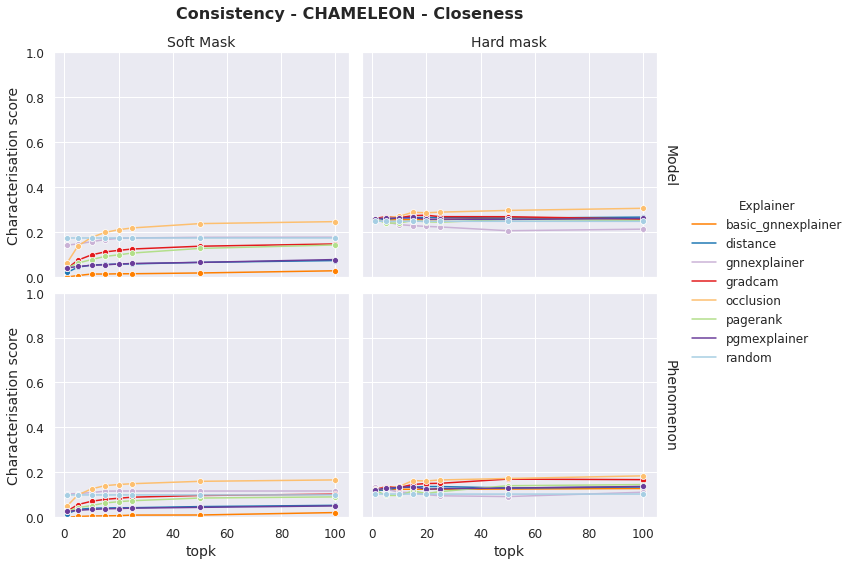

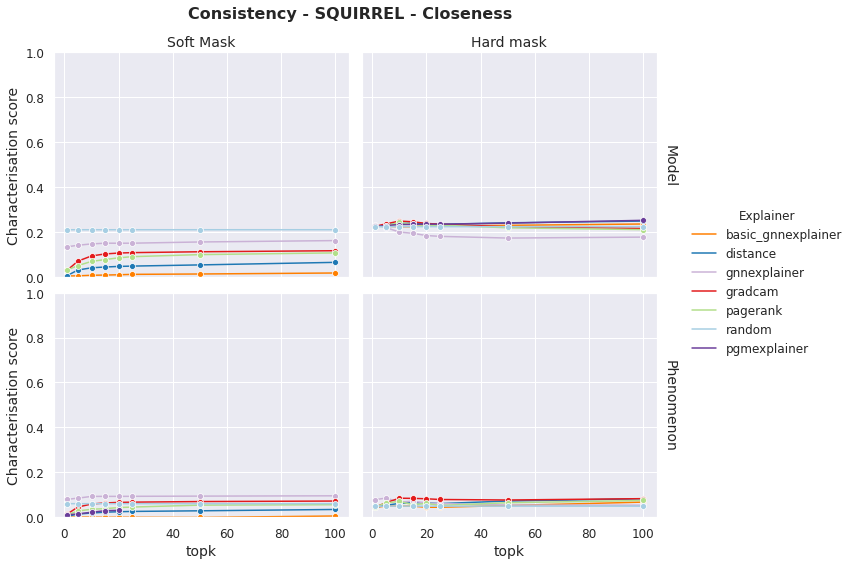

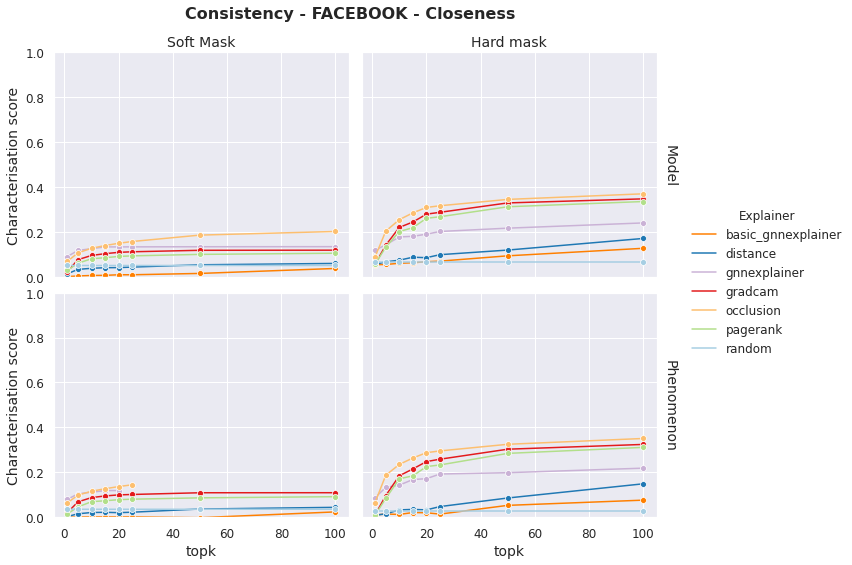

In [135]:
for data in datasets:
    df_gen_data = df_res[df_res['dataset']==data].groupby(['explainer_name', 'true_label_as_target', 'hard_mask', 'topk']).mean()
    df_gen_data = df_gen_data.reset_index()
    df_gen_data['hard_mask'] = df_gen_data['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen_data['true_label_as_target'] = df_gen_data['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})
    
    g = sns.FacetGrid(df_gen_data, row='true_label_as_target', col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.lineplot, x="topk", y="charact_prob",
        hue="explainer_name", palette=dict_color, marker="o")
    g.set(ylim=(0,1))
    g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
    g.fig.suptitle('Consistency - '+data.upper()+' - Closeness', fontsize=16, weight='bold', x=0.43)
    g.add_legend(title="Explainer")
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="topk", y_var="Characterisation score")
    
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/consistency/fig_consistency_{data}.pdf')
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/consistency/fig_consistency_{data}.png')


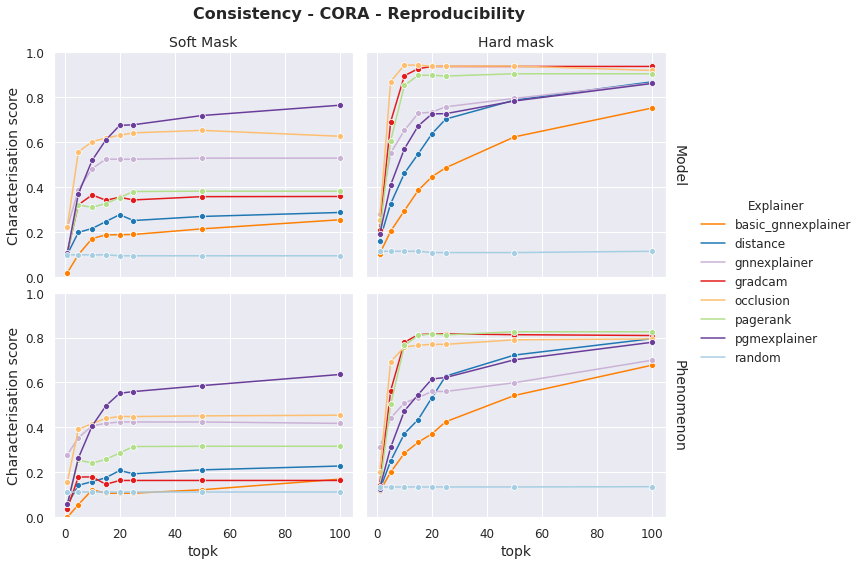

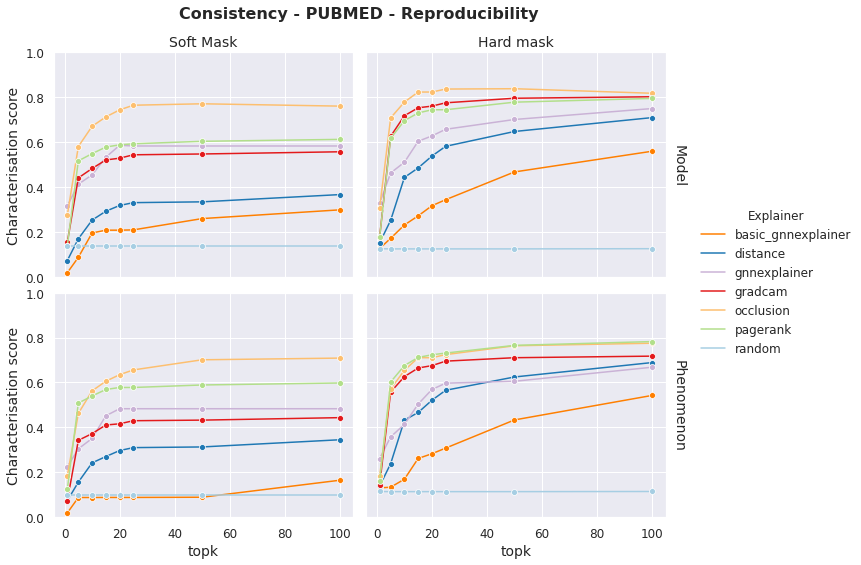

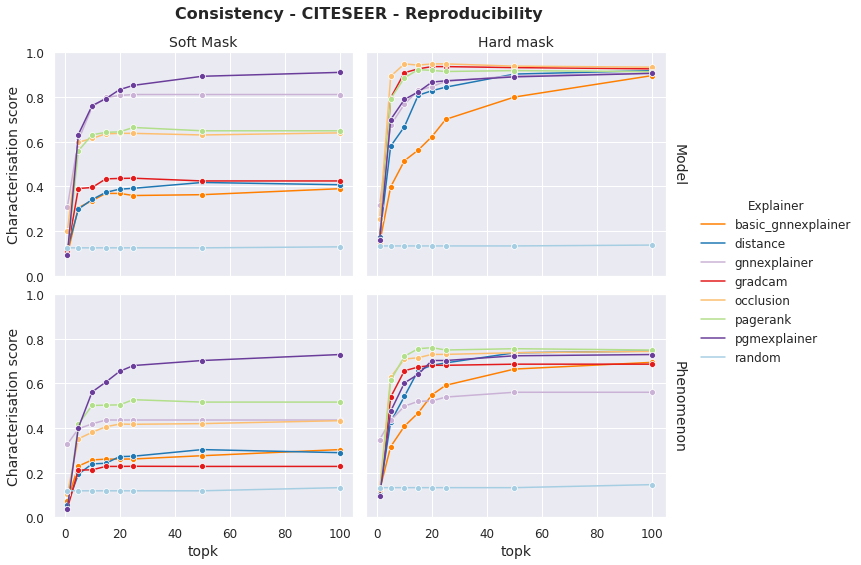

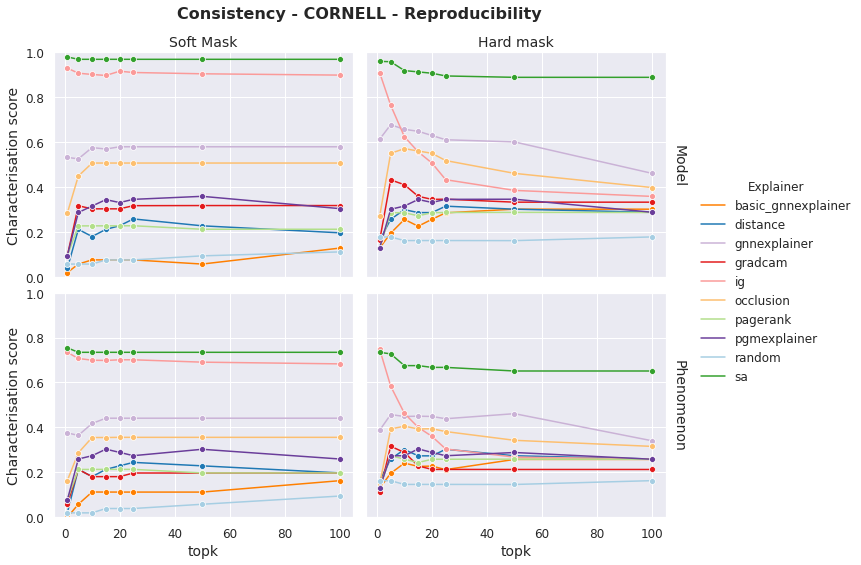

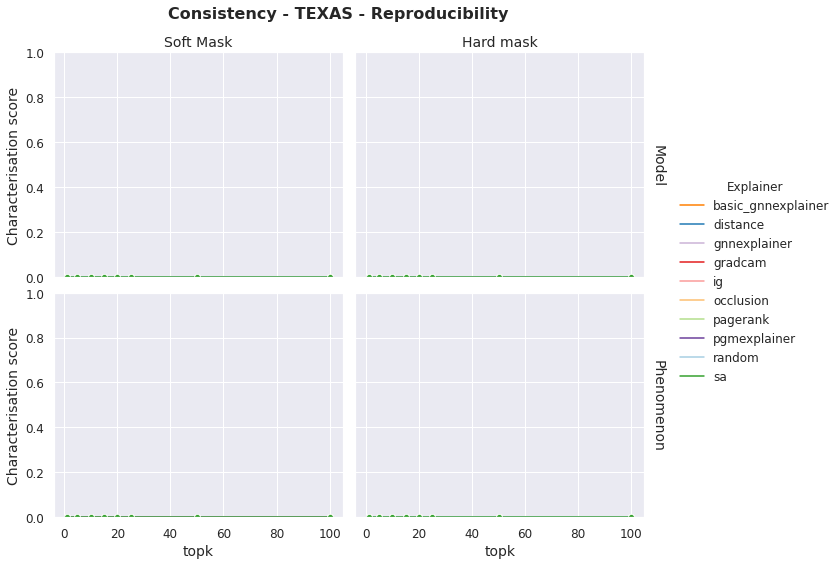

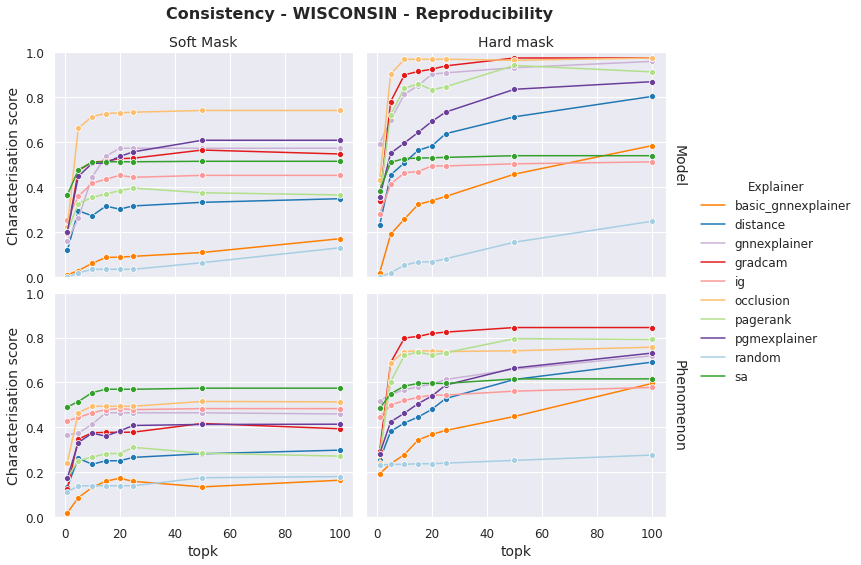

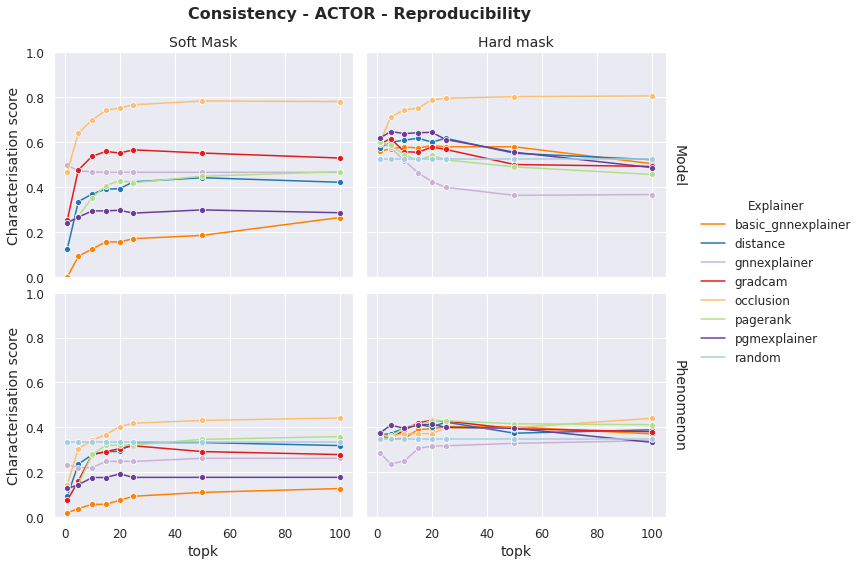

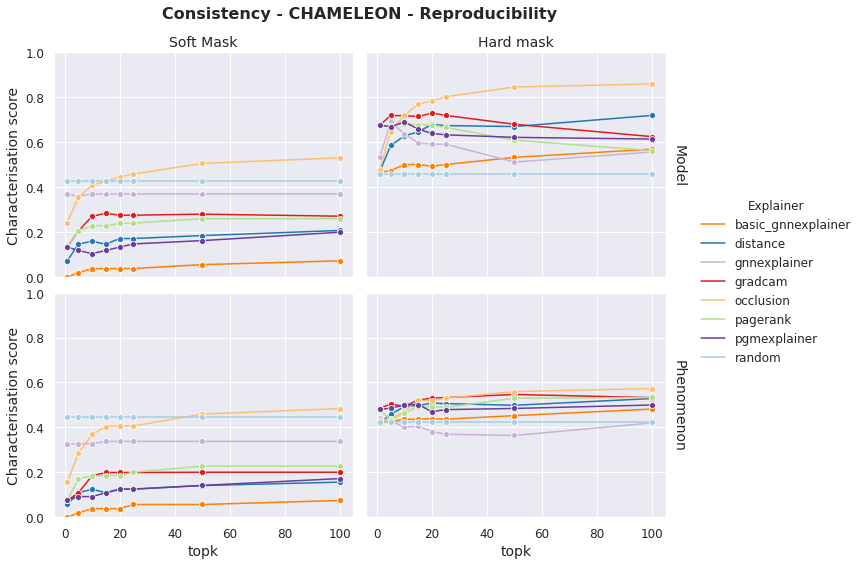

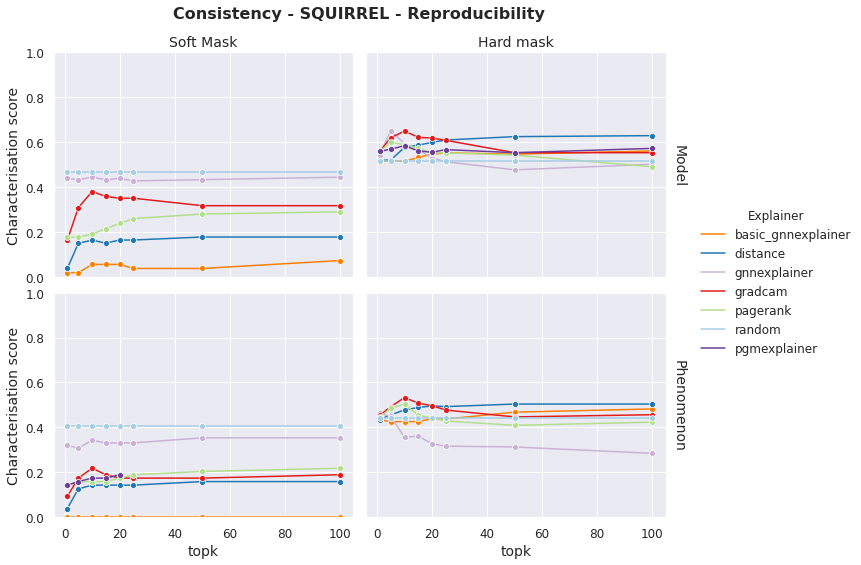

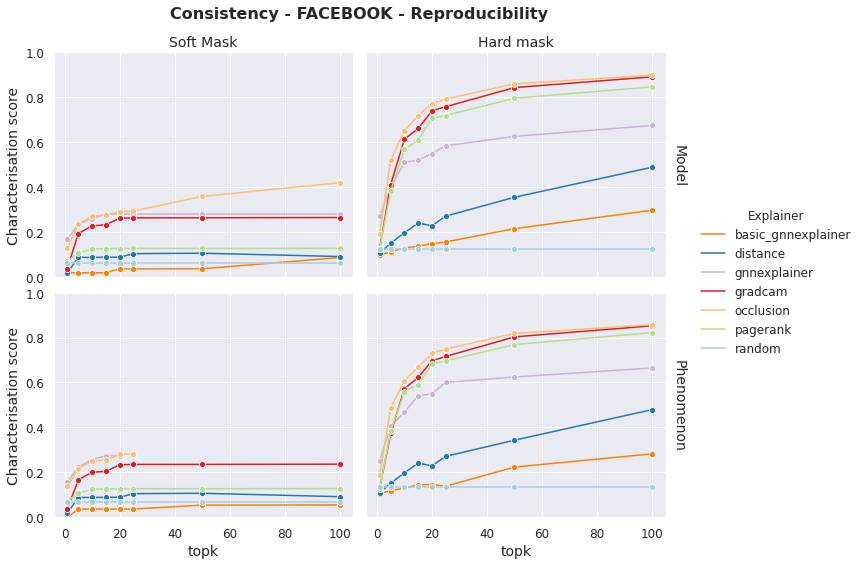

In [137]:
for data in datasets:
    df_gen_data = df_res[df_res['dataset']==data].groupby(['explainer_name', 'true_label_as_target', 'hard_mask', 'topk']).mean()
    df_gen_data = df_gen_data.reset_index()
    df_gen_data['hard_mask'] = df_gen_data['hard_mask'].replace({False:'Soft Mask', True:'Hard mask'})
    df_gen_data['true_label_as_target'] = df_gen_data['true_label_as_target'].replace({False:'Model', True:'Phenomenon'})
    
    g = sns.FacetGrid(df_gen_data, row='true_label_as_target', col="hard_mask", height=4, aspect=1.25, margin_titles=True, despine=False)
    g.map_dataframe(sns.lineplot, x="topk", y="charact_acc",
        hue="explainer_name", palette=dict_color, marker="o")
    g.set(ylim=(0,1))
    g.fig.subplots_adjust(top=0.9) # adjust the Figure in rp
    g.fig.suptitle('Consistency - '+data.upper()+' - Reproducibility', fontsize=16, weight='bold', x=0.43)
    g.add_legend(title="Explainer")
    g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
    g.set_axis_labels(x_var="topk", y_var="Characterisation score")
    
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/consistency/fig_consistency_{data}.pdf')
    #g.savefig(f'/cluster/home/kamara/Explain/figures/topk/consistency/fig_consistency_{data}.png')


# Explain focus: Phenomenon

true_label_as_target = True

In [138]:
df = df_res[df_res['true_label_as_target']==True]

In [139]:
#### Robustness ####
df_sparse = df[df['topk'] == 10]
df_dense = df[df['topk'] ==100]
df_sparse = df_sparse[["dataset", "true_label_as_target", "hard_mask", "explainer_name", "charact_prob"]].reset_index()
df_dense = df_dense[["dataset", "true_label_as_target", "hard_mask", "explainer_name", "charact_prob"]].reset_index()
df_robust = pd.merge(df_dense, df_sparse, on=["dataset", "true_label_as_target", "hard_mask", "explainer_name"], how="outer", suffixes=["_100", "_10"])

df_robust["robustness"] = (df_robust["charact_prob_10"]-df_robust["charact_prob_100"])

robustness = pd.pivot_table(df_robust, values='robustness', index=['explainer_name'], columns='dataset')
robustness['robustness'] = robustness.mean(axis=1)
robustness.sort_values(by=['robustness'])

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,robustness
explainer_name,,,,,,,,,,,
distance,-0.015163,-0.007322,-0.058748,-0.110511,-0.075874,-0.069601,-0.100043,-0.018254,-0.072778,-0.080445,-0.060874
pgmexplainer,-0.016176,-0.009998,-0.040122,-0.088486,-0.087141,NaN,NaN,NaN,-0.076413,-0.094810,-0.059021
basic_gnnexplainer,-0.014807,-0.009364,-0.045806,-0.062750,-0.048276,-0.043056,-0.103981,-0.011467,-0.019464,-0.067722,-0.042669
pagerank,-0.006167,-0.043572,-0.017158,-0.026428,-0.007042,-0.080924,-0.058831,-0.012156,-0.003720,-0.015704,-0.027170
gradcam,-0.018651,-0.033331,-0.009373,-0.014817,-0.004877,-0.080526,-0.055816,-0.005626,-0.007901,-0.015492,-0.024641
gnnexplainer,0.009145,-0.003439,-0.010110,-0.032409,-0.021428,-0.075451,-0.047335,0.005685,-0.030767,-0.019962,-0.022607
occlusion,-0.008849,-0.043585,0.007805,0.002979,0.013493,-0.115375,-0.020901,NaN,0.015671,0.004648,-0.016013
ig,NaN,NaN,NaN,NaN,0.007963,NaN,NaN,NaN,-0.025575,-0.020194,-0.012602
sa,NaN,NaN,NaN,NaN,0.003325,NaN,NaN,NaN,-0.020090,-0.013309,-0.010025


## Hard mask

In [140]:
df_hard = df[df.hard_mask==True]

### Initial analysis: initial sparsity, time, characterisation

In [141]:
df0 = df_hard.groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean()
df0 = df0.reset_index()
df0s = df0[df0.topk==10]
res_init = df0s[['dataset', 'explainer_name', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_prob+', 'fidelity_prob-', 'charact_prob']]
res_init.groupby(by=['dataset', 'explainer_name']).mean()


mask_size_init  number_of_edges    time  \
dataset   explainer_name                                                
actor     basic_gnnexplainer         1208.43          60918.0  3.7073   
          distance                  60913.74          60918.0  0.8446   
          gnnexplainer               1208.43          60918.0  7.5077   
          gradcam                   54935.47          60918.0  0.0076   
          occlusion                  1208.43          60918.0  3.3735   
...                                      ...              ...     ...   
wisconsin occlusion                   290.10           1151.0  0.6651   
          pagerank                   1082.04           1151.0  0.0262   
          pgmexplainer                517.66           1151.0  2.5542   
          random                     1148.96           1151.0  0.0001   
          sa                          829.70           1151.0  0.0048   

                              fidelity_prob+  fidelity_prob-  charact_prob  
dataset   explainer_name                                                    
actor     basic_gnnexplainer       -0.005658        0.012583     -0.011382  
          distance                 -0.002665       -0.003293     -0.005343  
          gnnexplainer              0.007238       -0.050273      0.014376  
          gradcam                   0.012671       -0.032136      0.025035  
          occlusion                 0.033097       -0.061434      0.064193  
...                                      ...             ...           ...  
wisconsin occlusion                 0.137023       -0.047719      0.242351  
          pagerank                  0.105687        0.009220      0.191001  
          pgmexplainer              0.041617       -0.016774      0.079962  
          random                   -0.006555        0.116333     -0.013209  
          sa                        0.126337        0.063886      0.222628  

[82 rows x 6 columns]

In [142]:
#### Initial mask sparsity ####
mask_size_init = pd.pivot_table(res_init, values='mask_size_init', index=['explainer_name'], columns='dataset')
mask_size_init['mean_size'] = mask_size_init.mean(axis=1)
mask_size_init.sort_values(by=['mean_size'])

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,mean_size
explainer_name,,,,,,,,,,,
sa,NaN,NaN,NaN,NaN,616.04,NaN,NaN,NaN,575.60,829.70,673.780000
ig,NaN,NaN,NaN,NaN,691.79,NaN,NaN,NaN,576.06,1118.87,795.573333
occlusion,1208.43,13544.43,64.05,151.45,216.62,7477.30,472.10,NaN,265.09,290.10,2632.174444
pgmexplainer,5265.66,17122.12,137.82,357.41,358.17,NaN,NaN,NaN,384.18,517.66,3449.002857
basic_gnnexplainer,1208.43,13544.42,64.05,159.74,216.62,7723.95,472.10,214622.64,265.09,290.10,23856.714000
gnnexplainer,1208.43,13544.43,64.05,159.74,216.62,7723.95,472.10,214622.64,265.09,290.10,23856.715000
pagerank,16493.80,25285.94,708.67,2150.00,708.82,24342.23,5927.50,282171.10,712.75,1082.04,35958.285000
gradcam,54935.47,46902.89,5987.35,4953.99,448.46,193580.20,22927.56,357790.32,403.67,743.47,68867.338000
distance,60913.74,65010.66,6259.29,11867.13,730.97,364105.64,108358.14,401890.54,734.79,1136.78,102100.768000


In [143]:
#### Computation Time ####
df_time = pd.pivot_table(res_init, values='time', index=['explainer_name'], columns='dataset')
df_time['mean_time'] = df_time.mean(axis=1)
df_time.sort_values(by=['mean_time'])

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,mean_time
explainer_name,,,,,,,,,,,
random,0.0007,0.0009,0.0002,0.0002,0.0001,0.0044,0.0012,0.0042,0.0001,0.0001,0.001210
sa,NaN,NaN,NaN,NaN,0.0049,NaN,NaN,NaN,0.0025,0.0048,0.004067
gradcam,0.0076,0.0082,0.0069,0.0076,0.0066,0.0146,0.0085,0.0155,0.0063,0.0064,0.008820
ig,NaN,NaN,NaN,NaN,0.2256,NaN,NaN,NaN,0.1201,0.2215,0.189067
distance,0.8446,0.6991,0.9227,0.3377,0.0199,1.7970,1.6221,2.8375,0.0198,0.0282,0.912860
pagerank,0.9611,0.8128,0.9475,0.3483,0.0214,2.7038,1.7064,3.7221,0.0204,0.0262,1.127000
basic_gnnexplainer,3.7073,3.8935,7.3190,3.7516,7.3908,7.5011,7.5422,10.7933,7.4091,7.5780,6.688590
gnnexplainer,7.5077,3.9319,3.7698,7.3813,7.2331,7.8384,7.3202,10.7426,3.7496,7.6338,6.710840
occlusion,3.3735,25.7054,0.7925,0.6900,0.3432,32.2669,2.9148,NaN,0.4082,0.6651,7.462178


In [144]:
#### Average characterization power among datasets for sparsity=0.99 ####
df_char = pd.pivot_table(res_init, values='charact_prob', index=['explainer_name'], columns='dataset')
df_char['mean_charact'] = df_char.mean(axis=1)
df_char.sort_values(by=['mean_charact'])#.reset_index()

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,mean_charact
explainer_name,,,,,,,,,,,
random,-0.014095,0.103565,0.016690,0.003066,0.004985,0.026606,-0.034526,0.049569,-0.000564,-0.013209,0.014209
basic_gnnexplainer,-0.011382,0.124775,0.059818,0.039265,0.035880,0.012745,-0.051340,0.049486,0.010981,-0.002985,0.026724
distance,-0.005343,0.133222,0.075015,0.041351,0.057242,0.032914,0.039478,0.061949,0.032477,0.045820,0.051413
pgmexplainer,-0.010895,0.132988,0.106709,0.081287,0.084304,NaN,NaN,NaN,0.047679,0.079962,0.074576
gnnexplainer,0.014376,0.111742,0.129470,0.121413,0.132496,0.143255,0.113243,0.067933,0.026395,0.187079,0.104740
pagerank,0.027411,0.097242,0.137994,0.174847,0.185775,0.171449,0.180145,0.070707,0.164822,0.191001,0.140139
gradcam,0.025035,0.132549,0.173167,0.199183,0.213382,0.184999,0.204825,0.085053,0.193405,0.191682,0.160328
ig,NaN,NaN,NaN,NaN,0.228089,NaN,NaN,NaN,0.167979,0.185111,0.193727
occlusion,0.064193,0.137384,0.176132,0.222397,0.235311,0.235427,0.255915,NaN,0.197568,0.242351,0.196297


In [145]:
#### Average characterization power for Cora according to sparsity ####
df0 = df_hard.groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean()
df0 = df0.reset_index()
res_init = df0[['dataset', 'explainer_name', 'topk', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_prob+', 'fidelity_prob-', 'charact_prob']]
res_init.groupby(by=['dataset', 'explainer_name', 'topk']).mean()

df_char_cora = pd.pivot_table(res_init[res_init.dataset=="cora"], values='charact_prob', index=['explainer_name'], columns='topk')
df_char_cora['mean_charact'] = df_char_cora.mean(axis=1)
df_char_cora.sort_values(by=['mean_charact'])

topk,1.0,5.0,10.0,15.0,20.0,25.0,50.0,100.0,mean_charact
explainer_name,,,,,,,,,
random,0.003005,0.003066,0.003066,0.003066,0.003066,0.003066,0.002717,0.002747,0.002975
basic_gnnexplainer,-0.010047,0.021243,0.039265,0.053664,0.063499,0.066566,0.097701,0.134384,0.058284
distance,-0.009550,0.012728,0.041351,0.066979,0.092431,0.117278,0.142556,0.189386,0.081645
pgmexplainer,-0.005976,0.040211,0.081287,0.107985,0.125469,0.130206,0.153507,0.187732,0.102553
gnnexplainer,0.092135,0.107703,0.121413,0.119334,0.130597,0.130009,0.141576,0.179576,0.127793
pagerank,-0.008457,0.084927,0.174847,0.204809,0.204238,0.206612,0.208902,0.208902,0.160597
gradcam,-0.004927,0.118322,0.199183,0.208103,0.214455,0.216702,0.215940,0.215977,0.172969
occlusion,0.039970,0.195069,0.222397,0.219962,0.220349,0.219789,0.220567,0.216069,0.194272


### Analysis after mask tranformation

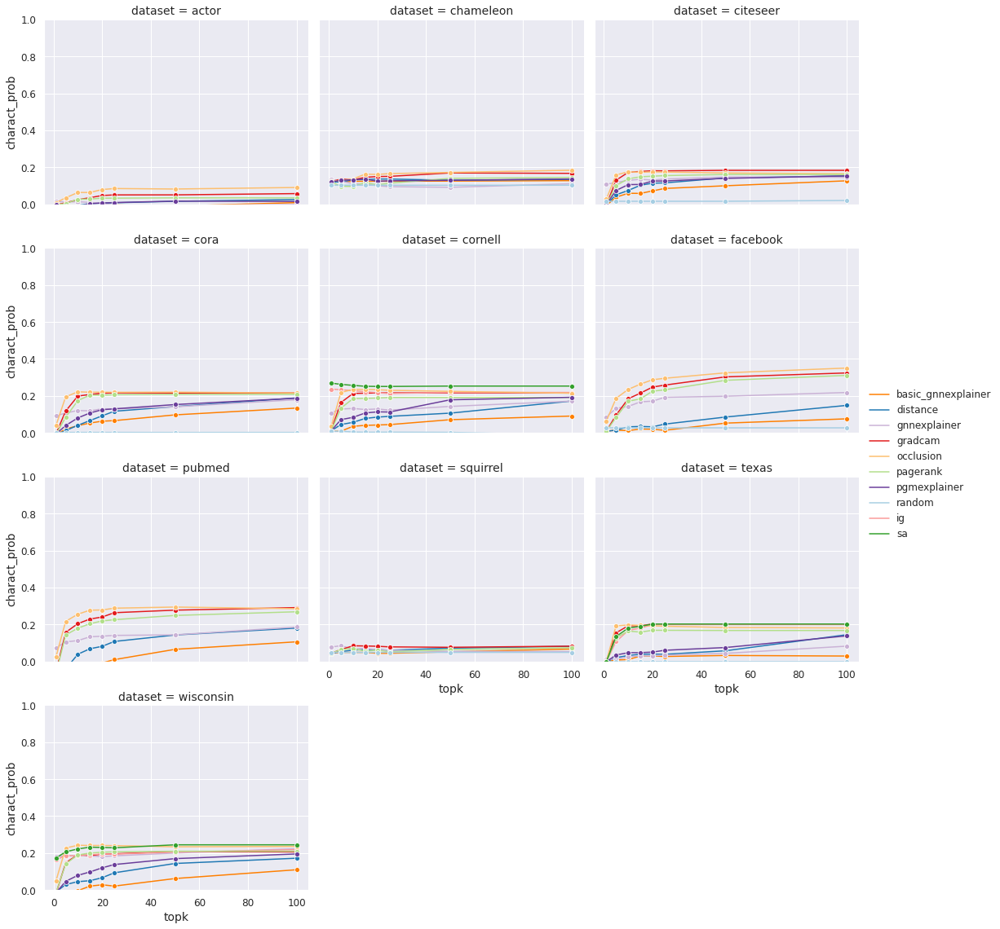

In [156]:
g = sns.FacetGrid(df_hard, col="dataset", height=4, aspect=1.25, col_wrap=3)
g.map_dataframe(sns.lineplot, x="topk", y="charact_prob",
    hue="explainer_name", palette=dict_color, marker="o")
g.set(ylim=(0,1))
g.add_legend()

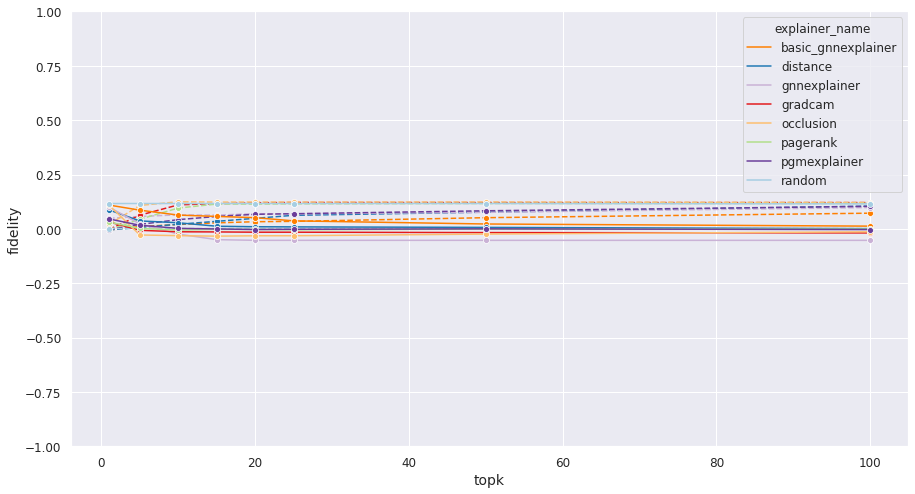

In [157]:
#### Fidelity Prob VS Sparsity ####

fig, ax = plt.subplots(figsize=(15,8))
g0 = sns.lineplot(
    data=df_hard[df_hard.dataset=="cora"],
    x="topk", y="fidelity_prob+",
    hue="explainer_name", palette=dict_color, marker="o", linestyle='--', ax=ax, legend=False)
for line in g0.lines:
    line.set_linestyle("--")

g1 = sns.lineplot(
    data=df_hard[df_hard.dataset=="cora"],
    x="topk", y="fidelity_prob-",
    hue="explainer_name", palette=dict_color, marker="o", ax=ax)

plt.ylim(-1,1)
plt.ylabel('fidelity')
plt.show()

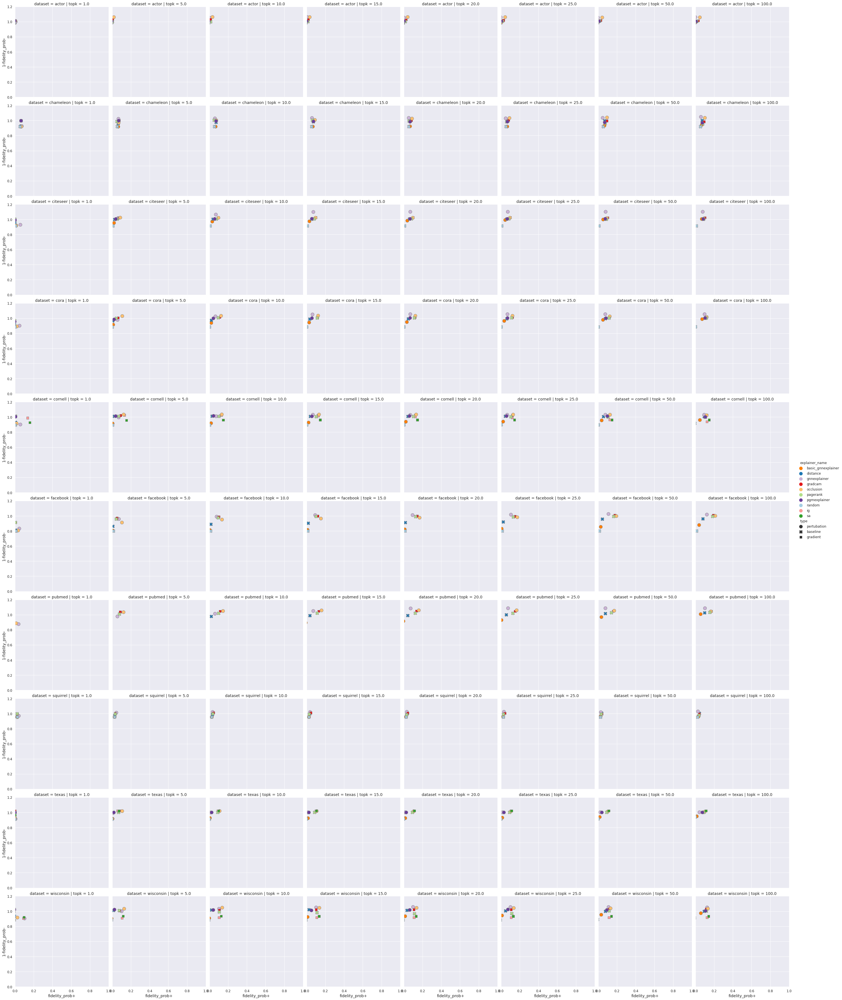

In [148]:
#### Fidelity Prob VS datasets & sparsity ####
g = sns.relplot(
    data=df_hard,
    x="fidelity_prob+", y="1-fidelity_prob-", col="topk", row="dataset", 
    hue="explainer_name", palette=dict_color, s=140, style="type", alpha =1, edgecolor="grey"
)
plt.xlim(0, 1)
plt.ylim(0, 1.2)

for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 
    

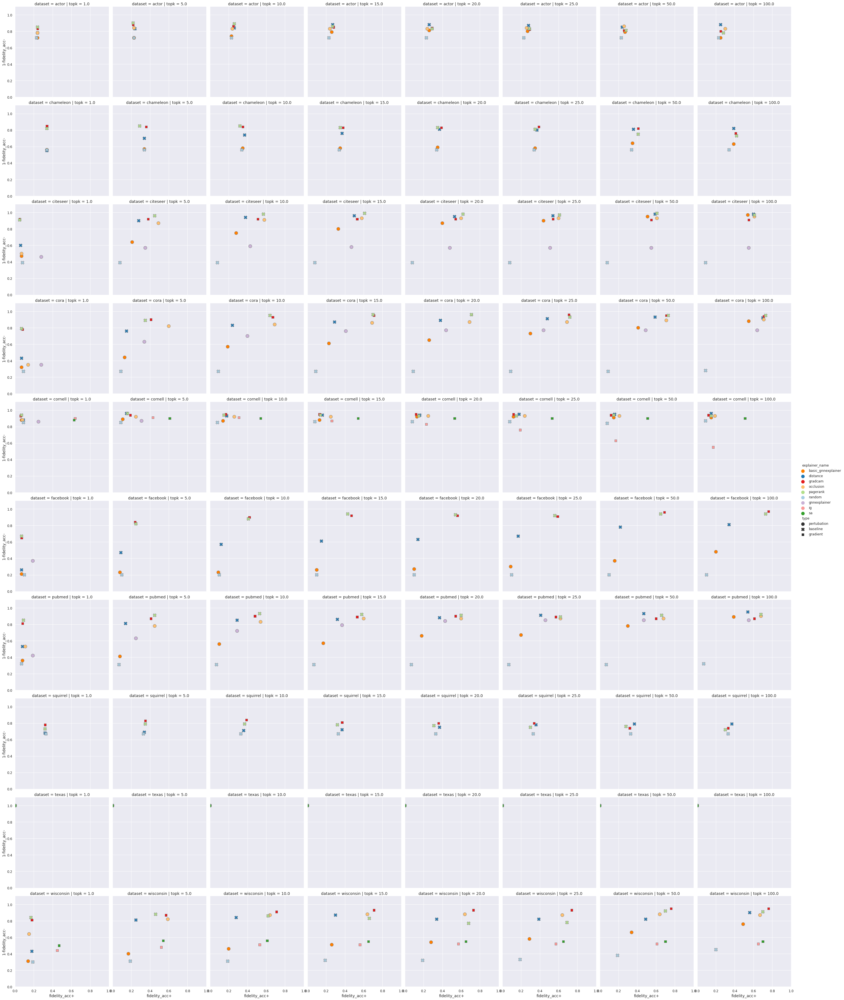

In [83]:
#### Fidelity Acc VS datasets & sparsity ####
g = sns.relplot(
        data=df_hard,
        x="fidelity_acc+", y="1-fidelity_acc-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha = 1, edgecolor="grey"
    )

plt.xlim(0, 1)
plt.ylim(0, 1.1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 


## Soft mask

In [150]:
df_soft = df[df.hard_mask==False]

In [151]:
df0 = df_soft.groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean()
df0 = df0.reset_index()
df0s = df0[df0.topk==10]
res_init = df0s[['dataset', 'explainer_name', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_prob+', 'fidelity_prob-', 'charact_prob']]
res_init.groupby(by=['dataset', 'explainer_name']).mean()

#### Average characterization power among datasets for sparsity=0.7 ####
df_char = pd.pivot_table(res_init, values='charact_prob', index=['explainer_name'], columns='dataset')
df_char['mean_charact'] = df_char.mean(axis=1)
df_char.sort_values(by=['mean_charact'])

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,mean_charact
explainer_name,,,,,,,,,,,
basic_gnnexplainer,-0.007404,0.005722,0.054940,0.041665,0.036069,0.001525,0.025870,0.000899,0.004384,0.023152,0.018682
distance,0.024145,0.040363,0.081806,0.067838,0.087165,0.021305,0.089802,0.019065,0.031529,0.088906,0.055192
random,0.019953,0.099553,0.046511,0.056151,0.039521,0.035808,0.091133,0.060649,NaN,0.056685,0.056218
pgmexplainer,0.006962,0.034896,0.123951,0.120701,0.129643,NaN,NaN,0.022626,0.052356,0.105935,0.074634
pagerank,0.018931,0.052134,0.126036,0.150653,0.155292,0.069511,0.173369,0.035763,0.135703,0.164224,0.108162
gradcam,0.057735,0.071265,0.128480,0.143565,0.157387,0.087689,0.176488,0.059026,0.117429,0.170833,0.116990
gnnexplainer,0.044771,0.110090,0.144622,0.158369,0.170904,0.111655,0.191135,0.093006,0.094289,0.208894,0.132774
occlusion,0.074966,0.126310,0.136705,0.166399,0.181487,0.116083,0.239190,NaN,0.138722,0.192586,0.152494
ig,NaN,NaN,NaN,NaN,0.203841,NaN,NaN,NaN,0.090196,0.172678,0.155572


In [154]:
#### Average characterization power for Cora according to sparsity ####
df0 = df_soft.groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean()
df0 = df0.reset_index()
res_init = df0[['dataset', 'explainer_name', 'topk', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_prob+', 'fidelity_prob-', 'charact_prob']]
res_init.groupby(by=['dataset', 'explainer_name', 'topk']).mean()

df_char_cora = pd.pivot_table(res_init[res_init.dataset=="cora"], values='charact_prob', index=['explainer_name'], columns='topk')
df_char_cora['mean_charact'] = df_char_cora.mean(axis=1)
df_char_cora.sort_values(by=['mean_charact'])


topk,1.0,5.0,10.0,15.0,20.0,25.0,50.0,100.0,mean_charact
explainer_name,,,,,,,,,
basic_gnnexplainer,0.004742,0.025197,0.041665,0.047215,0.048447,0.049371,0.056787,0.072047,0.043184
random,0.056109,0.056128,0.056151,0.056183,0.056127,0.056124,0.056255,0.057375,0.056306
distance,0.010888,0.046374,0.067838,0.084365,0.096761,0.106532,0.120967,0.140826,0.084319
gradcam,0.025409,0.112021,0.143565,0.148980,0.151394,0.152940,0.155003,0.156404,0.130714
pgmexplainer,0.021428,0.088233,0.120701,0.141421,0.153415,0.163084,0.179487,0.191228,0.132375
pagerank,0.020647,0.110010,0.150653,0.160135,0.162657,0.165335,0.168543,0.169455,0.138429
occlusion,0.069685,0.157693,0.166399,0.167457,0.167715,0.167648,0.168258,0.166770,0.153953
gnnexplainer,0.128075,0.140187,0.158369,0.162889,0.164962,0.164923,0.164947,0.165023,0.156172


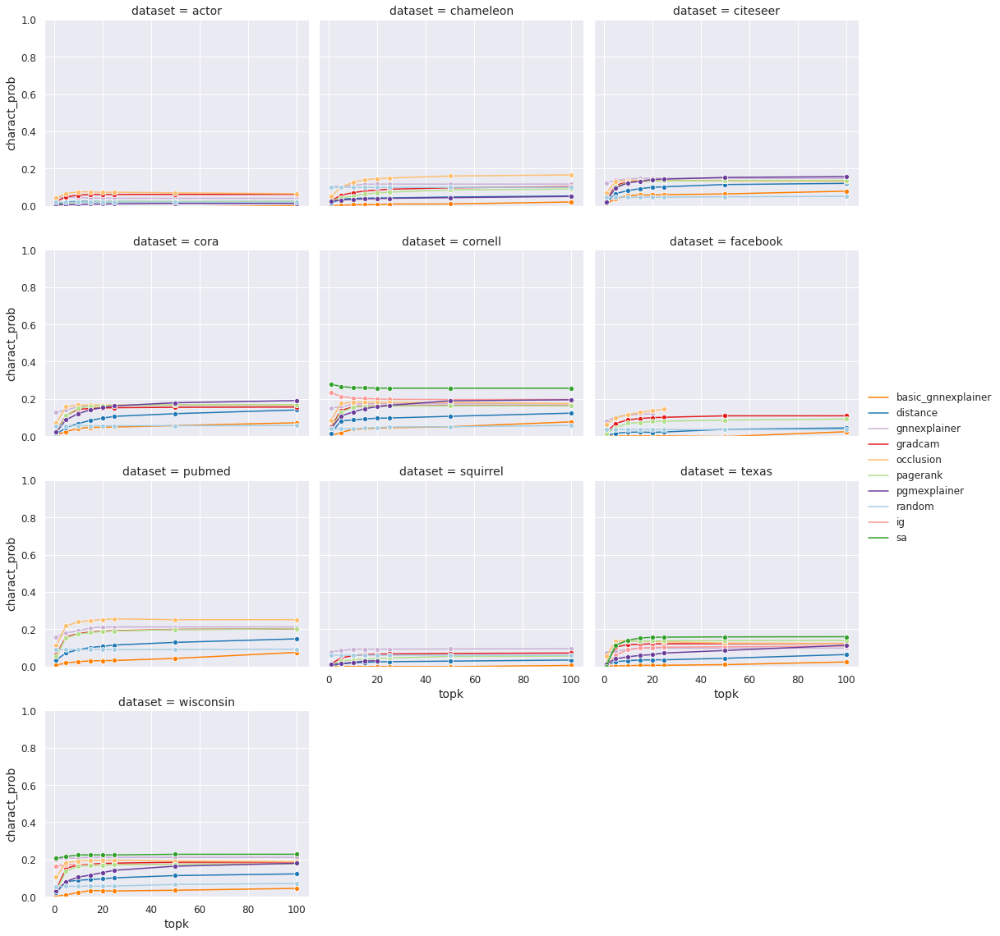

In [158]:
g = sns.FacetGrid(df_soft, col="dataset", height=4, aspect=1.25, col_wrap=3)
g.map_dataframe(sns.lineplot, x="topk", y="charact_prob",
    hue="explainer_name", palette=dict_color, marker="o")
g.set(ylim=(0,1))
g.add_legend()

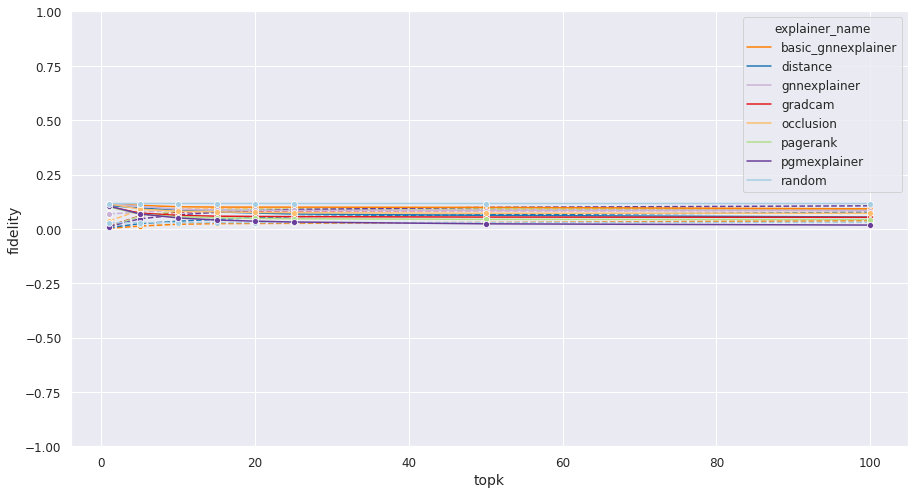

In [159]:
#### Fidelity Prob VS Sparsity ####

fig, ax = plt.subplots(figsize=(15,8))
g0 = sns.lineplot(
    data=df_soft[df_soft.dataset=="cora"],
    x="topk", y="fidelity_prob+",
    hue="explainer_name", palette=dict_color, marker="o", linestyle='--', ax=ax, legend=False)
for line in g0.lines:
    line.set_linestyle("--")

g1 = sns.lineplot(
    data=df_soft[df_soft.dataset=="cora"],
    x="topk", y="fidelity_prob-",
    hue="explainer_name", palette=dict_color, marker="o", ax=ax)

plt.ylim(-1,1)
plt.ylabel('fidelity')
plt.show()

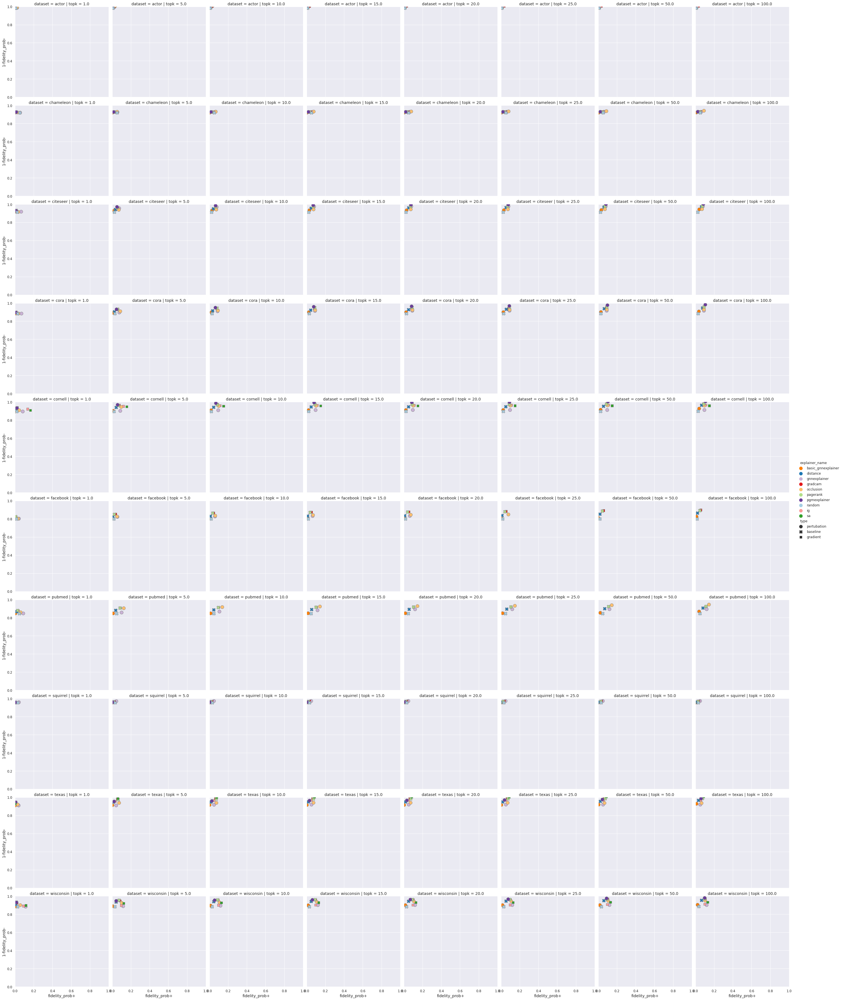

In [160]:
#### Fidelity Prob VS datasets & topk ####
g = sns.relplot(
        data=df_soft,
        x="fidelity_prob+", y="1-fidelity_prob-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha = 1, edgecolor="grey"
    )
plt.xlim(0, 1)
plt.ylim(0, 1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 

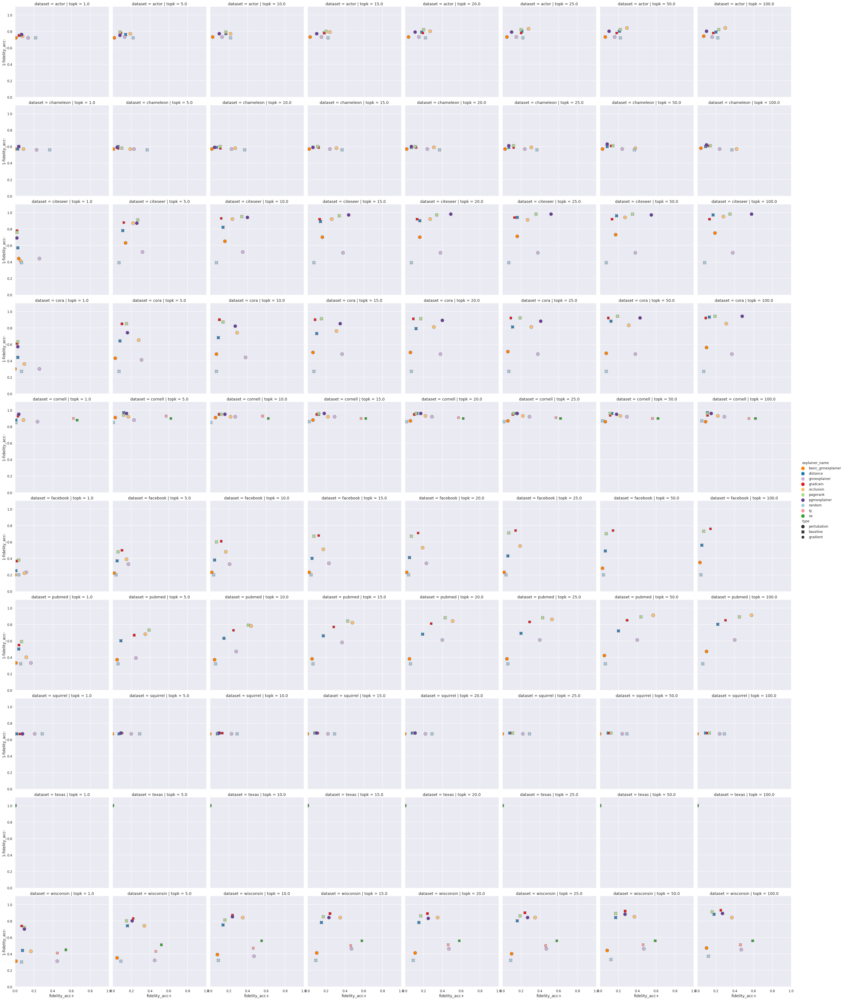

In [161]:
#### Fidelity Acc VS datasets & topk ####
g = sns.relplot(
        data=df_soft,
        x="fidelity_acc+", y="1-fidelity_acc-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha =1, edgecolor="grey"
    )

plt.xlim(0, 1)
plt.ylim(0, 1.1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 

# Explain focus: GNN model

true_label_as_target = False

In [162]:
df_gnn = df_res[df_res['true_label_as_target']==False].reset_index()

In [163]:
df_gnn

,index,dataset,true_label_as_target,hard_mask,topk,explainer_name,num_test,fidelity_acc+,fidelity_acc-,fidelity_prob+,...,number_of_edges,type,1-fidelity_acc-,1-fidelity_prob-,charact_prob,charact_acc,1-fidelity_gnn_acc-,1-fidelity_gnn_prob-,charact_gnn_prob,charact_gnn_acc
0,0,actor,False,False,1.0,basic_gnnexplainer,100.0,0.00,-1.0,0.002503,...,60918.0,pertubation,0.58,0.886779,0.004993,0.000000,0.58,0.886779,0.004993,0.000000
1,1,actor,False,False,1.0,distance,100.0,0.07,-1.0,0.016935,...,60918.0,baseline,0.61,0.893534,0.033239,0.125588,0.61,0.893534,0.033239,0.125588
2,2,actor,False,False,1.0,gnnexplainer,100.0,0.43,-1.0,0.074586,...,60918.0,pertubation,0.59,0.901947,0.137778,0.497451,0.59,0.901947,0.137778,0.497451
3,3,actor,False,False,1.0,gradcam,100.0,0.16,-1.0,0.037296,...,60918.0,gradient,0.62,0.917929,0.071679,0.254359,0.62,0.917929,0.071679,0.254359
4,4,actor,False,False,1.0,occlusion,100.0,0.38,-1.0,0.062185,...,60918.0,pertubation,0.61,0.916624,0.116469,0.468283,0.61,0.916624,0.116469,0.468283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1307,2451,wisconsin,False,True,100.0,occlusion,100.0,0.99,-1.0,0.193737,...,1151.0,pertubation,0.96,0.968093,0.322863,0.974769,0.96,0.968093,0.322863,0.974769
1308,2452,wisconsin,False,True,100.0,pagerank,100.0,1.00,-1.0,0.181995,...,1151.0,baseline,0.84,0.955634,0.305760,0.913043,0.84,0.955634,0.305760,0.913043
1309,2453,wisconsin,False,True,100.0,pgmexplainer,100.0,0.89,-1.0,0.165318,...,1151.0,pertubation,0.85,0.949393,0.281601,0.869540,0.85,0.949393,0.281601,0.869540
1310,2454,wisconsin,False,True,100.0,random,100.0,0.23,-1.0,0.055436,...,1151.0,baseline,0.27,0.849434,0.104079,0.248400,0.27,0.849434,0.104079,0.248400


## Hard mask

In [164]:
df_gnn_hard = df_gnn[df_gnn.hard_mask==True]

In [166]:
df0 = df_gnn_hard.groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean().reset_index()
df0s = df0[df0.topk==10]
res_init = df0s[['dataset', 'explainer_name', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_gnn_prob+', 'fidelity_gnn_prob-', 'charact_gnn_prob', 'charact_gnn_acc']]
res_init.groupby(by=['dataset', 'explainer_name']).mean()
#### Average characterization power among datasets for topk=0.7 ####
df_char = pd.pivot_table(res_init, values='charact_gnn_prob', index=['explainer_name'], columns='dataset')
df_char['mean_charact_gnn_prob'] = df_char.mean(axis=1)
df_char.sort_values(by=['mean_charact_gnn_prob'])

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,mean_charact_gnn_prob
explainer_name,,,,,,,,,,,
random,0.214700,0.248452,0.078829,0.058604,0.053650,0.066753,0.120611,0.224433,0.001158,0.105590,0.117278
basic_gnnexplainer,0.232951,0.255249,0.143275,0.091176,0.085875,0.061491,0.128287,0.224076,0.052744,0.125871,0.140100
distance,0.240693,0.264629,0.166922,0.118128,0.122882,0.075147,0.180904,0.239306,0.101972,0.164910,0.167549
pgmexplainer,0.245904,0.262521,0.203780,0.131173,0.153000,NaN,NaN,0.233963,0.128912,0.182839,0.192761
gnnexplainer,0.218344,0.233226,0.206418,0.153169,0.218250,0.178605,0.191665,0.200584,0.064989,0.285982,0.195123
pagerank,0.227697,0.241093,0.240190,0.224232,0.281049,0.202596,0.250366,0.243093,0.287414,0.283472,0.248120
gradcam,0.231680,0.264201,0.249595,0.239271,0.296004,0.221068,0.255720,0.249192,0.293179,0.303678,0.260359
occlusion,0.258003,0.270499,0.262822,0.257355,0.323931,0.255426,0.291087,NaN,0.314793,0.319415,0.283703
ig,NaN,NaN,NaN,NaN,0.325704,NaN,NaN,NaN,0.256292,0.274150,0.285382


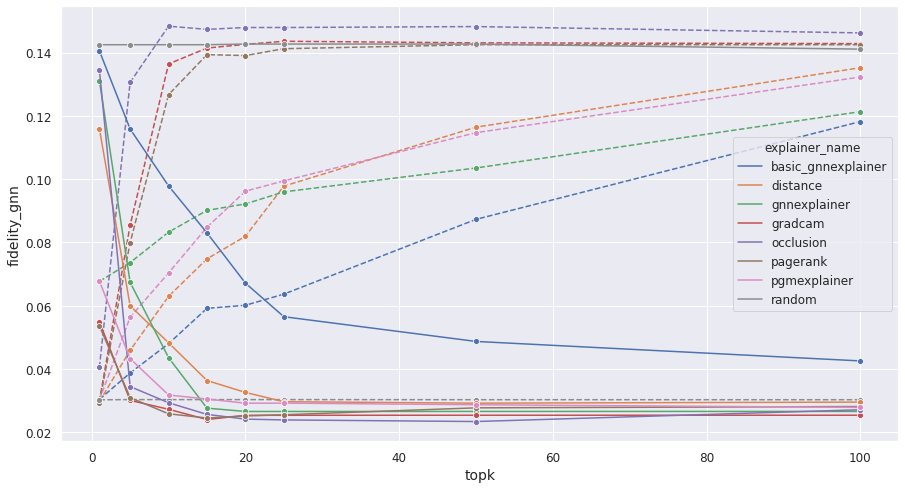

In [167]:
#### Fidelity Prob VS topk ####

fig, ax = plt.subplots(figsize=(15,8))
g0 = sns.lineplot(
    data=df_gnn_hard[df_gnn_hard.dataset=="cora"],
    x="topk", y="fidelity_gnn_prob+",
    hue="explainer_name", marker="o", linestyle='--', ax=ax, legend=False)
for line in g0.lines:
    line.set_linestyle("--")

g1 = sns.lineplot(
    data=df_gnn_hard[df_gnn_hard.dataset=="cora"],
    x="topk", y="fidelity_gnn_prob-",
    hue="explainer_name", marker="o", ax=ax)


plt.ylabel('fidelity_gnn')
plt.show()

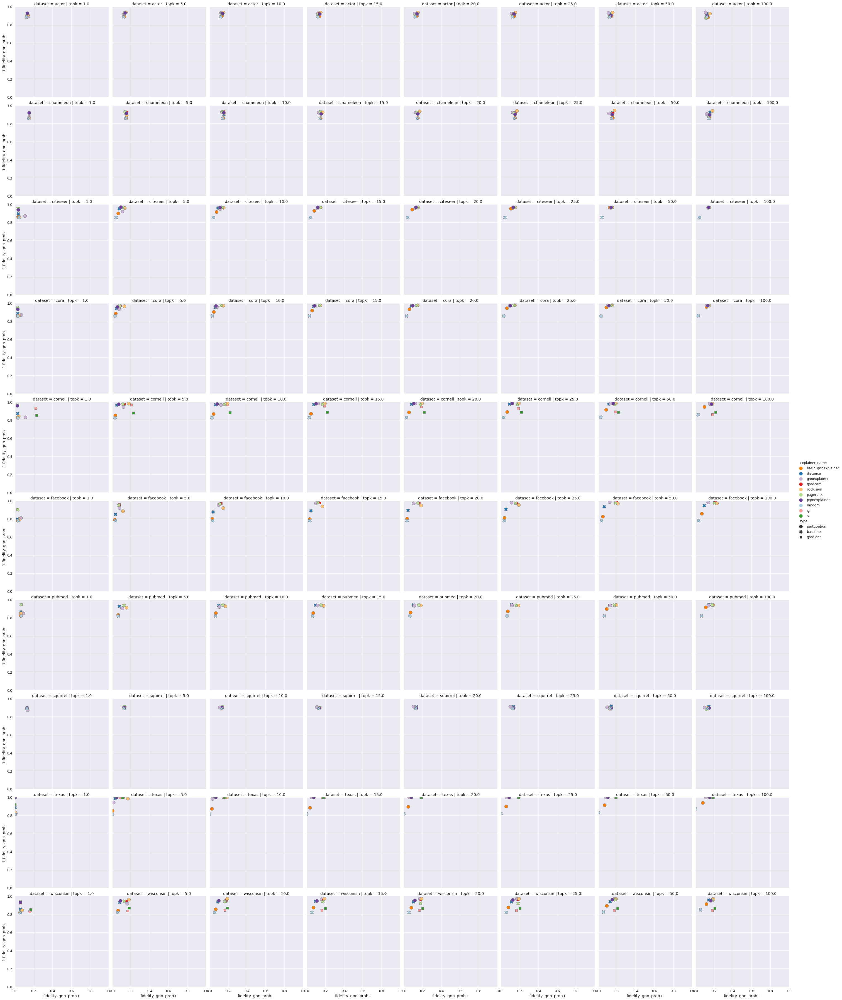

In [168]:
#### Fidelity Prob VS datasets & topk ####
g = sns.relplot(
        data=df_gnn_hard,
        x="fidelity_gnn_prob+", y="1-fidelity_gnn_prob-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha = 1, edgecolor="grey"
    )

plt.xlim(0, 1)
plt.ylim(0, 1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 

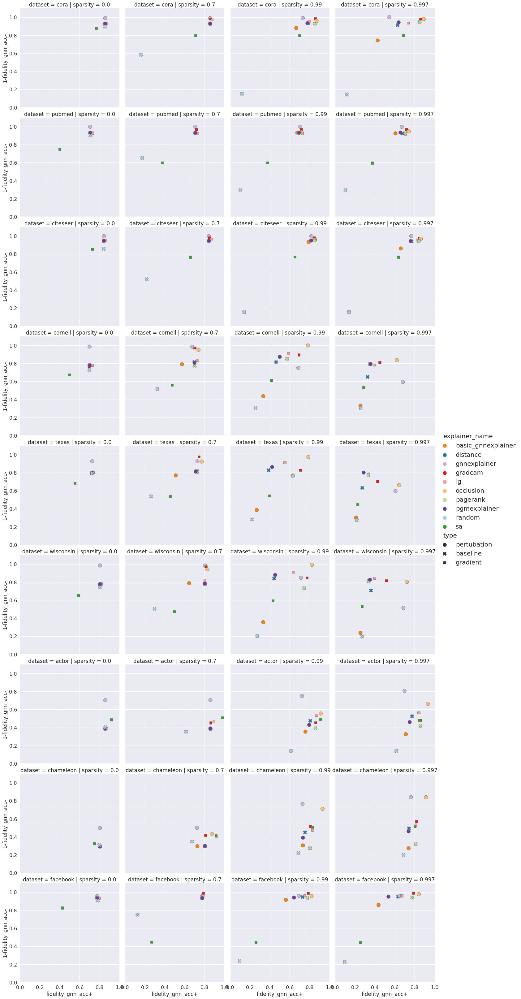

In [65]:
#### Fidelity Acc VS datasets & topk ####
g = sns.relplot(
        data=df_gnn_hard,
        x="fidelity_gnn_acc+", y="1-fidelity_gnn_acc-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha =1, edgecolor="grey"
    )
plt.xlim(0, 1)
plt.ylim(0, 1.1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 

## Soft mask

In [169]:
df_gnn_soft = df_gnn[df_gnn.hard_mask==False]

In [173]:
##### Characterization #####
df1 = df_gnn_soft.groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean().reset_index()
df1s = df1[df1.topk==10]
res_init = df1s[['dataset', 'explainer_name', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_gnn_prob+', 'fidelity_gnn_prob-', 'charact_gnn_prob', 'charact_gnn_acc']]
res_init.groupby(by=['dataset', 'explainer_name']).mean()
#### Average characterization power among datasets for topk=0.7 ####
df_char = pd.pivot_table(res_init, values='charact_gnn_prob', index=['explainer_name'], columns='dataset')
df_char['mean_charact_gnn_prob'] = df_char.mean(axis=1)
df_char.sort_values(by=['mean_charact_gnn_prob'])

dataset,actor,chameleon,citeseer,cora,cornell,facebook,pubmed,squirrel,texas,wisconsin,mean_charact_gnn_prob
explainer_name,,,,,,,,,,,
basic_gnnexplainer,0.041529,0.013592,0.111493,0.057873,0.050500,0.007073,0.057231,0.008002,0.046153,0.046548,0.043999
distance,0.114181,0.053643,0.153084,0.103195,0.121920,0.039086,0.119834,0.041273,0.077904,0.127692,0.095181
random,NaN,0.173990,0.087198,0.077112,0.076601,0.051544,0.110494,0.210659,0.037992,0.093095,0.102076
pgmexplainer,0.097807,0.052301,0.216059,0.154614,0.200680,NaN,NaN,NaN,0.120103,0.161815,0.143340
gradcam,0.152651,0.098822,0.198190,0.176174,0.218551,0.096178,0.198502,0.094048,0.182395,0.234844,0.165036
pagerank,0.140458,0.077736,0.214247,0.187596,0.234366,0.081510,0.208983,0.069693,0.236546,0.236985,0.168812
gnnexplainer,0.160553,0.157441,0.226800,0.191111,0.249203,0.126369,0.215058,0.147539,0.164993,0.290492,0.192956
occlusion,0.188261,0.176735,0.217436,0.200180,0.250811,0.128165,0.261123,NaN,0.225281,0.262129,0.212236
ig,NaN,NaN,NaN,NaN,0.299018,NaN,NaN,NaN,0.153781,0.266502,0.239767


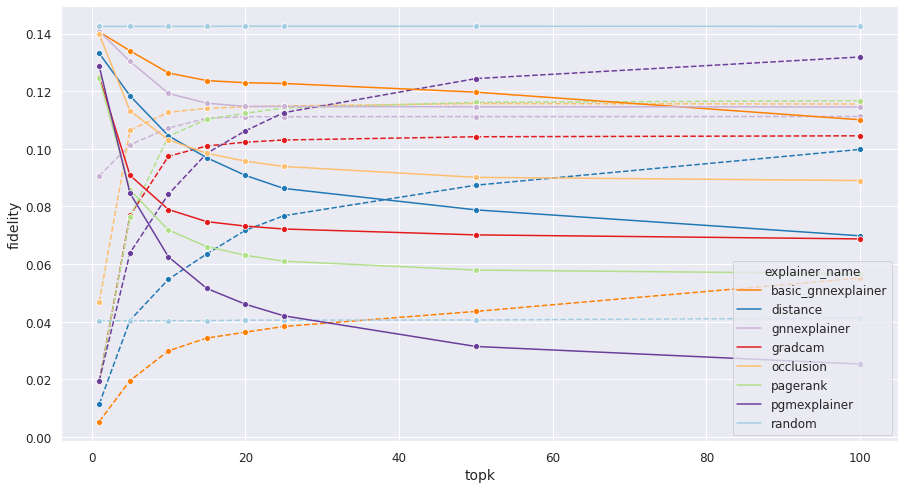

In [174]:
#### Fidelity Prob VS topk ####

fig, ax = plt.subplots(figsize=(15,8))
g0 = sns.lineplot(
    data=df_gnn_soft[df_gnn_soft.dataset=="cora"],
    x="topk", y="fidelity_gnn_prob+",
    hue="explainer_name", palette=dict_color, marker="o", linestyle='--', ax=ax, legend=False)
for line in g0.lines:
    line.set_linestyle("--")

g1 = sns.lineplot(
    data=df_gnn_soft[df_gnn_soft.dataset=="cora"],
    x="topk", y="fidelity_gnn_prob-",
    hue="explainer_name", palette=dict_color, marker="o", ax=ax)


plt.ylabel('fidelity')
plt.show()

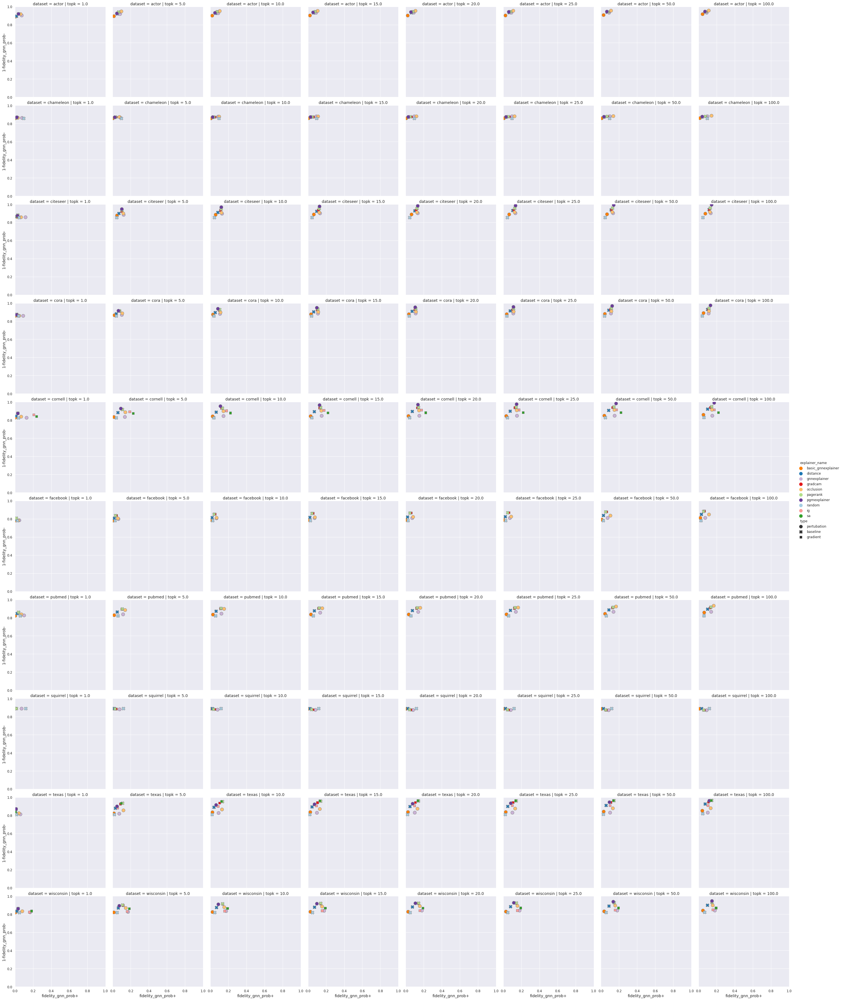

In [175]:
#### Fidelity Prob VS datasets & topk ####
g = sns.relplot(
        data=df_gnn_soft,
        x="fidelity_gnn_prob+", y="1-fidelity_gnn_prob-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha =1, edgecolor="grey"
    )
plt.xlim(0, 1)
plt.ylim(0, 1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 

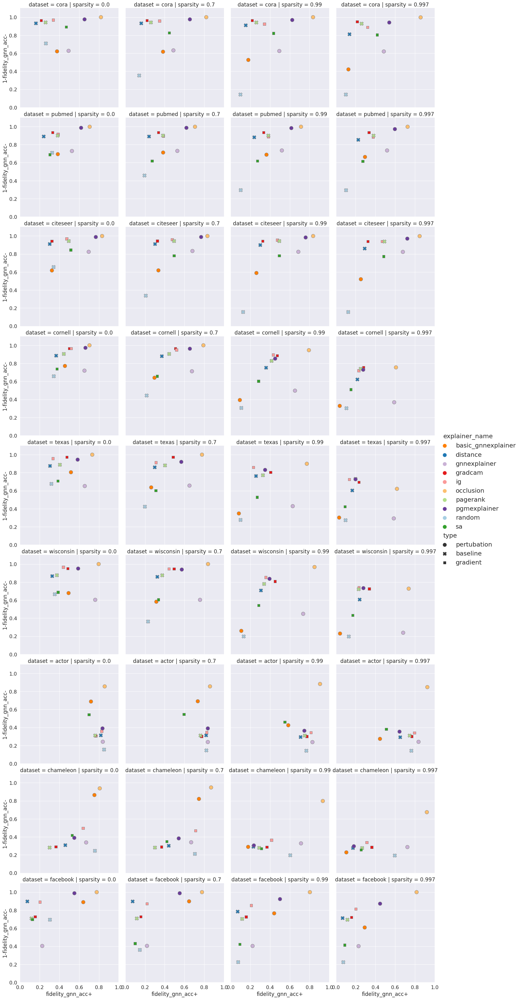

In [72]:
#### Fidelity Acc VS datasets & topk ####
g = sns.relplot(
        data=df_gnn_soft,
        x="fidelity_gnn_acc+", y="1-fidelity_gnn_acc-", col="topk", row="dataset", 
        hue="explainer_name", palette=dict_color, s=140, style="type", alpha =1, edgecolor="grey"
    )

plt.xlim(0, 1)
plt.ylim(0, 1.1)
for lh in g._legend.legendHandles: 
    lh.set_alpha(1)
    lh._sizes = [130] 

# Characterization Summary

In [184]:
topk = 5
names = ["_hard", "_soft", "_gnn_hard", "_gnn_soft"]
dfs = []
for name in names:
    df = eval("df"+name).groupby(by=['dataset', 'explainer_name', 'topk', 'true_label_as_target', 'hard_mask']).mean().reset_index()
    df_small = df[df.topk==topk]
    if name.startswith('_gnn'):
        df_small['charact_prob'] = df_small['charact_gnn_prob']
    res_init = df_small[['dataset', 'explainer_name', 'mask_size_init', 'number_of_edges', 'time', 'fidelity_prob+', 'fidelity_prob-', 'charact_prob']]
    res_init.groupby(by=['dataset', 'explainer_name']).mean()
    #### Average characterization power among datasets for sparsity=0.7 ####
    df_char = pd.pivot_table(res_init, values='charact_prob', index=['explainer_name'], columns='dataset')
    df_char['charact_prob'] = df_char.mean(axis=1)
    df_char.sort_values(by=['charact_prob'])

    c = df_char.rename_axis(None, axis=1).reset_index()
    c = c[["explainer_name", "charact_prob"]]
    dfs.append(c)
    

    

/tmp/ipykernel_16425/3490956780.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_small['charact_prob'] = df_small['charact_gnn_prob']


In [185]:
for i in range(4):
    locals()["c"+names[i]] = dfs[i]

In [186]:
s_phen = pd.merge(dfs[0], dfs[1], on="explainer_name", how="outer", suffixes=["_phen_hard", "_phen_soft"])
s_gnn = pd.merge(dfs[2], dfs[3], on="explainer_name", how="outer", suffixes=["_gnn_hard", "_gnn_soft"])
summary = pd.merge(s_phen, s_gnn, on="explainer_name", how="outer")
summary = summary.sort_values(by=['charact_prob_phen_soft', 'charact_prob_phen_hard'])
summary

,explainer_name,charact_prob_phen_hard,charact_prob_phen_soft,charact_prob_gnn_hard,charact_prob_gnn_soft
0,basic_gnnexplainer,0.017449,0.011602,0.127097,0.029085
1,distance,0.030480,0.046047,0.145765,0.079517
8,random,0.014644,0.056134,0.117930,0.101803
7,pgmexplainer,0.055904,0.058855,0.174183,0.118799
6,pagerank,0.098419,0.088309,0.205370,0.140538
3,gradcam,0.117949,0.099728,0.218230,0.141614
2,gnnexplainer,0.101344,0.124678,0.187184,0.180548
5,occlusion,0.173632,0.140794,0.259631,0.195586
4,ig,0.176308,0.149345,0.255874,0.226733
9,sa,0.201601,0.199129,0.284745,0.276815


In [187]:
summary.to_csv(f'/cluster/home/kamara/Explain/csv/node_classification/real/summary/charact_summary_1expe_top{topk}.csv')